# Try to add a nifty model for sampling the input map

numpy version: 2.1.1


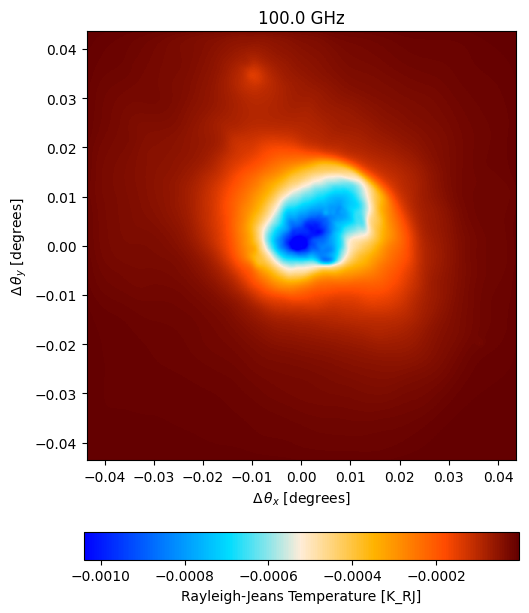

In [1]:
import numpy as np
print(f"numpy version: {np.__version__}")
import matplotlib.pyplot as plt
import maria
import sys
import os

# Relative import of sample_maps for now
sys.path.append(os.path.abspath('../nifty_maria'))
import mapsampling_jax
from mapsampling_jax import sample_maps

map_filename = maria.io.fetch("maps/cluster.fits")

# load in the map from a fits file
input_map = maria.map.read_fits(filename=map_filename, #filename
                                resolution=8.714e-05, #pixel size in degrees
                                index=0, #index for fits file
                                center=(150, 10), # position in the sky
                                units='Jy/pixel' # Units of the input map 
                               )

input_map.to(units="K_RJ").plot()

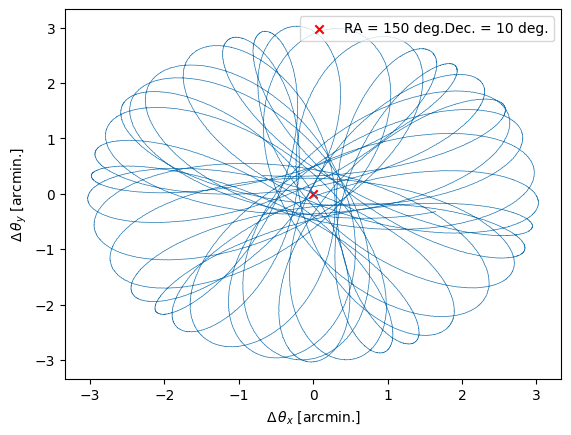

In [2]:
#load the map into maria
plan = maria.get_plan(scan_pattern="daisy", # scanning pattern
                      scan_options={"radius": 0.05, "speed": 0.01}, # in degrees
                      duration=600, # integration time in seconds
                    # duration=60,
                    #   duration=300, # integration time in seconds
                      sample_rate=50, # in Hz
                      scan_center=(150, 10), # position in the sky
                      frame="ra_dec")

plan.plot()

2024-12-03 10:28:17.060 INFO: Initialized base in 1995 ms.
Building atmosphere:  17%|█▋        | 1/6 [00:00<00:04,  1.19it/s]

Building atmosphere: 100%|██████████| 6/6 [00:05<00:00,  1.12it/s]
2024-12-03 10:28:24.111 INFO: Initialized atmosphere in 7035 ms.
Generating noise: 100%|██████████| 1/1 [00:00<00:00,  2.10it/s]


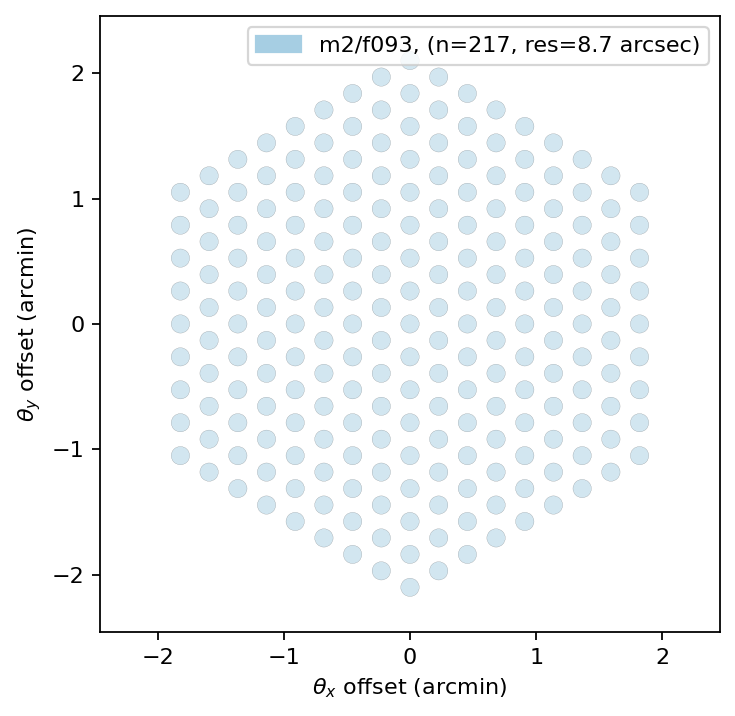

In [3]:
# instrument = maria.get_instrument('MUSTANG-2')
instrument = mapsampling_jax.instrument
instrument.plot()

sim_truthmap = maria.Simulation(instrument, 
                                plan=plan,
                                site="llano_de_chajnantor", 
                                map=input_map,
                                # noise=False,
                                atmosphere="2d",
                                # cmb="generate",
                                )

tod_truthmap = sim_truthmap.run()

In [4]:
dx, dy = sim_truthmap.coords.offsets(frame=sim_truthmap.map.frame, center=sim_truthmap.map.center)
dx = dx.compute()
dy = dy.compute()

Running mapper (m2/f093): 100%|██████████| 1/1 [00:06<00:00,  6.57s/it]


mapdata_truth shape: (1, 1, 1000, 1000)
mapdata_truth mean: -8.726028151723567e-05


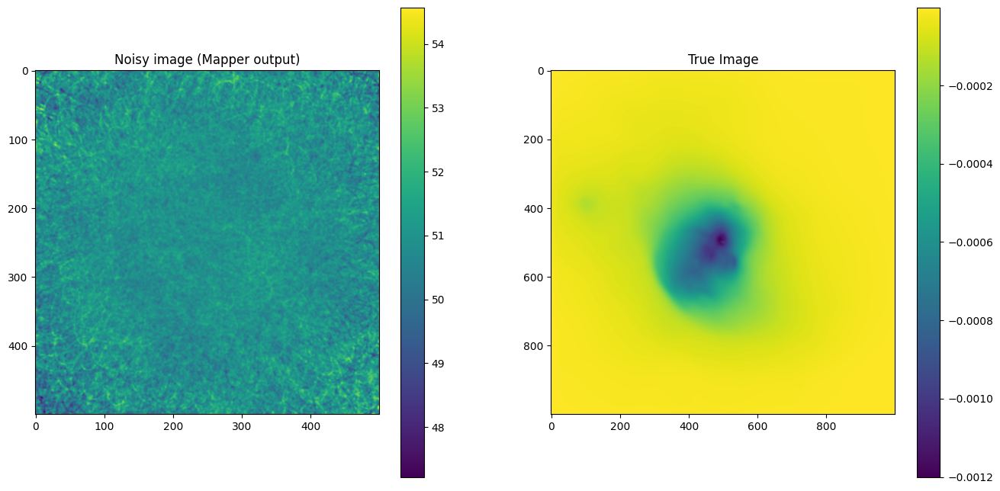

In [5]:
from maria.mappers import BinMapper

# Run mapper without any filtering to get noisy mimge
mapper_truthmap = BinMapper(center=(150, 10), frame="ra_dec", width=0.1, height=0.1, resolution=2e-4, map_postprocessing={"gaussian_filter": {"sigma": 1}} )
mapper_truthmap.add_tods(tod_truthmap)
output_truthmap = mapper_truthmap.run()

mapdata_truth = np.float64(sim_truthmap.map.data)
mapdata_truth = np.nan_to_num(mapdata_truth, nan=np.nanmean(mapdata_truth)) # replace nan value by img mean

print("mapdata_truth shape:", mapdata_truth.shape)
print("mapdata_truth mean:", mapdata_truth.mean())

fig, axes = plt.subplots(1, 2, figsize=(16, 8))

im0 = axes[0].imshow(output_truthmap.data[0].T)
fig.colorbar(im0)
axes[0].title.set_text("Noisy image (Mapper output)")

im1 = axes[1].imshow(mapdata_truth[0, 0])
fig.colorbar(im1)
axes[1].title.set_text("True Image")

plt.show()

# Re-implement map sampling in JAX for nifty response function:

In [6]:
# os.environ['CUDA_VISIBLE_DEVICES'] = '2'
os.environ['CUDA_VISIBLE_DEVICES'] = '0'

import jax
from jax import random
import jax.numpy as jnp

import nifty8.re as jft
import matplotlib.pyplot as plt

import numpy as np

from functools import reduce
from operator import or_

seed = 42
key = random.PRNGKey(seed)

2024-12-03 10:28:41.023 INFO: Unable to initialize backend 'rocm': module 'jaxlib.xla_extension' has no attribute 'GpuAllocatorConfig'
2024-12-03 10:28:41.025 INFO: Unable to initialize backend 'tpu': INTERNAL: Failed to open libtpu.so: libtpu.so: cannot open shared object file: No such file or directory


# Test TOD agreement:

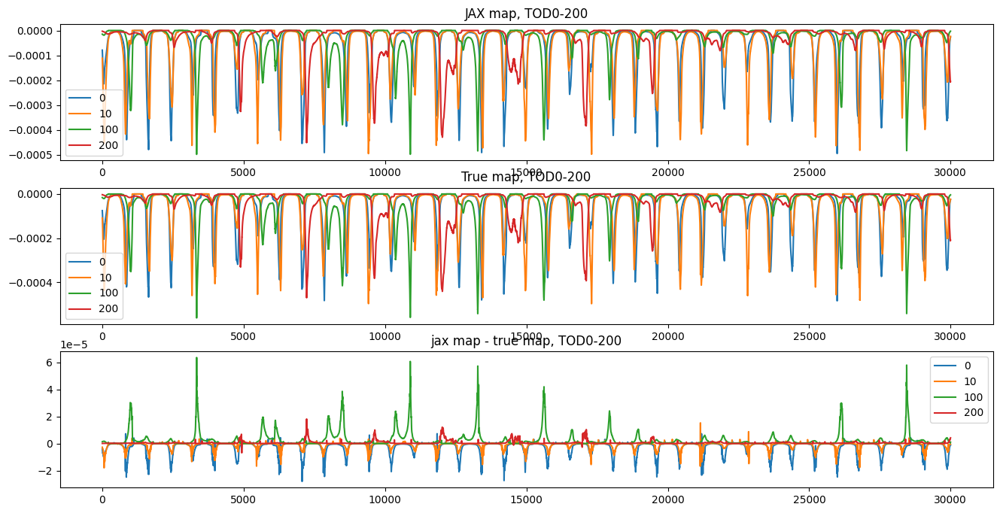

In [7]:
jax_tods_map = sample_maps(mapdata_truth, dx, dy, sim_truthmap.map.resolution, sim_truthmap.map.x_side, sim_truthmap.map.y_side)

fig, axes = plt.subplots(3, 1, figsize=(16, 8))

for i in [0, 10, 100, 200]:
    im0 = axes[0].plot(jax_tods_map[i], label=i)

    tods_map = np.float64(tod_truthmap.get_field('map').compute())
    im1 = axes[1].plot(tods_map[i], label=i)

    im2 = axes[2].plot(jax_tods_map[i] - tods_map[i], label=i)
    
axes[0].title.set_text(f'JAX map, TOD0-{i}')
axes[0].legend()
axes[1].title.set_text(f'True map, TOD0-{i}')
axes[1].legend()
axes[2].title.set_text(f'jax map - true map, TOD0-{i}')
axes[2].legend()

plt.show()

# Prepare noised input TODs:

Noise stddev: 0.0002516466255708462


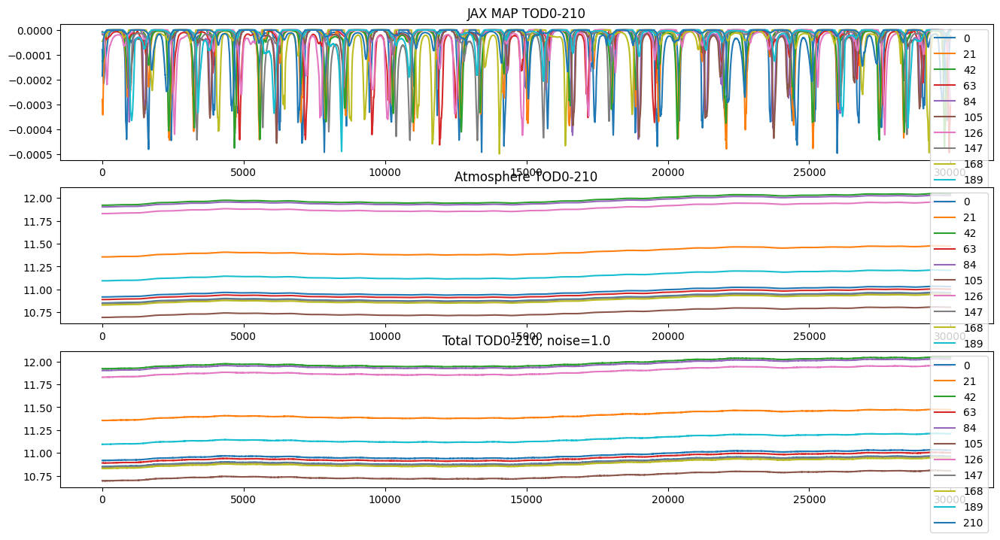

In [8]:
# Pick noise level for rest of run:
# noiselevel = 0.0
# noiselevel = 0.1
# noiselevel = 0.5
noiselevel = 1.0

# Add n TODs for atmos:
n = jax_tods_map.shape[0]

jax_tods_atmos = tod_truthmap.get_field('atmosphere')
# noised_jax_tod = np.float64(jax_tods_map) + np.float64(jax_tods_atmos) + np.float64(tod_truthmap.components['noise']*noiselevel)

noised_jax_tod = np.float64(jax_tods_map) + np.float64(tod_truthmap.get_field('noise')*noiselevel)
# noised_jax_tod = np.float64(tod_truthmap.get_field('noise')*noiselevel)
noised_jax_tod[:n] += np.float64(jax_tods_atmos[:n]) 

denoised_jax_tod = noised_jax_tod - np.float64(tod_truthmap.get_field('noise')*noiselevel)

print("Noise stddev:", np.std(tod_truthmap.get_field('noise').compute()))

fig, axes = plt.subplots(3, 1, figsize=(16, 8))

for i in range(0, n, n//10):
    im0 = axes[0].plot(jax_tods_map[i], label=i)
    im1 = axes[1].plot(jax_tods_atmos[i], label=i)
    im2 = axes[2].plot(noised_jax_tod[i], label=i)
    
axes[0].title.set_text(f'JAX MAP TOD0-{i}')
axes[0].legend()
axes[1].title.set_text(f'Atmosphere TOD0-{i}')
axes[1].legend()
axes[2].title.set_text(f'Total TOD0-{i}, noise={noiselevel}')
axes[2].legend()

plt.show()

## Test atmosphere slopes:

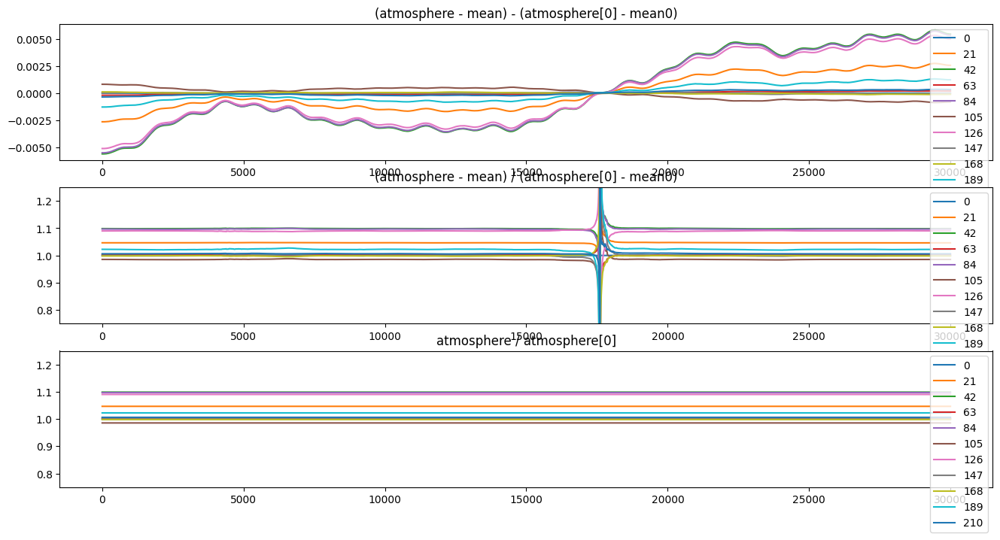

In [9]:
fig, axes = plt.subplots(3, 1, figsize=(16, 8))

for i in range(0, n, n//10 if n//10 != 0 else 1):
    axes[0].plot(jax_tods_atmos[i] - jax_tods_atmos[i].mean() - (jax_tods_atmos[0] - jax_tods_atmos[0].mean()), label=i)
    axes[1].plot( (jax_tods_atmos[i] - jax_tods_atmos[i].mean()) / (jax_tods_atmos[0] - jax_tods_atmos[0].mean()), label=i)
    axes[2].plot(jax_tods_atmos[i]/jax_tods_atmos[0], label=i)
    
axes[0].title.set_text(f'(atmosphere - mean) - (atmosphere[0] - mean0)')
axes[0].legend()
axes[1].title.set_text(f'(atmosphere - mean) / (atmosphere[0] - mean0)')
axes[1].legend()
axes[1].set_ylim([0.75, 1.25])
axes[2].title.set_text(f'atmosphere / atmosphere[0]')
axes[2].legend()
axes[2].set_ylim([0.75, 1.25])

plt.show()

In [10]:
print("real slopes:")
slopes_truth = (jax_tods_atmos) / (jax_tods_atmos[0])
slopes_truth = np.float64(slopes_truth.mean(axis=1))

slopes = noised_jax_tod / noised_jax_tod[0]
slopes = np.float64(slopes.mean(axis=1))
print(slopes_truth.shape)

slopes_truth - slopes

real slopes:
(217,)


array([ 0.00000000e+00,  8.03498343e-08, -9.73889629e-07, -4.91540724e-07,
       -2.72677537e-07, -3.09266546e-09, -8.32263207e-07, -5.13100525e-07,
       -1.13408012e-06, -9.54716901e-07, -1.93328620e-07, -4.36409288e-07,
       -7.94074382e-07, -9.84892902e-07, -1.55547870e-06, -1.28083886e-06,
       -1.32760845e-06, -1.20932545e-06, -2.56692396e-08, -1.24873556e-06,
       -1.16802655e-06, -9.66572612e-07, -1.58828344e-06, -1.71906131e-06,
       -2.45311440e-06, -8.47402284e-07, -6.91464675e-07, -1.11640317e-06,
       -1.35766728e-06, -6.29338403e-07, -2.00977587e-07, -7.06744526e-07,
       -1.17310470e-06, -1.42623221e-06, -1.86971870e-06, -1.96462993e-06,
       -1.34480366e-06, -2.13367898e-06, -1.47289478e-06, -8.34141805e-07,
       -2.79668586e-06, -1.51056408e-06, -1.74017404e-06, -1.55807775e-06,
       -1.84439832e-06, -2.50422884e-06, -2.24425503e-06, -1.89581976e-06,
       -1.56931873e-06, -1.48431767e-06, -1.35013853e-06, -2.38374286e-06,
       -2.09401481e-06, -

np.float64(-1.8897532605149064e-13)

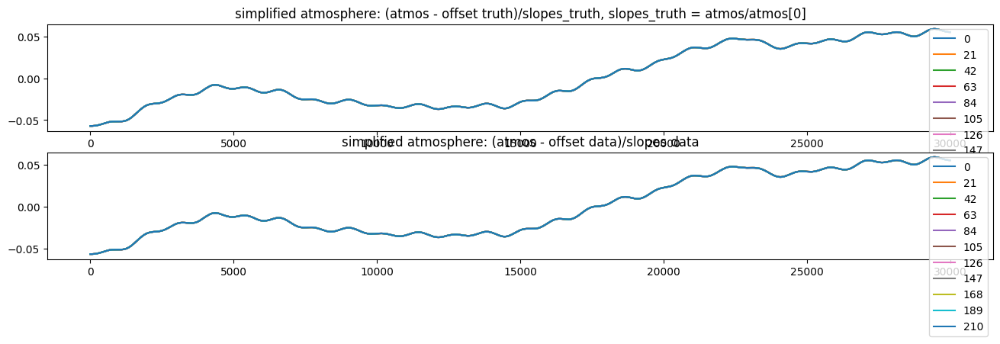

In [11]:
fig, axes = plt.subplots(2, 1, figsize=(16, 4))

# slopes_truth = (jax_tods_atmos - jax_tods_atmos.mean(axis=1)[:, None]) / (jax_tods_atmos[0] - jax_tods_atmos[0].mean())
# slopes_truth = (jax_tods_atmos - jax_tods_atmos.mean()) / (jax_tods_atmos[0] - jax_tods_atmos.mean())

offset_tod_truth = np.float64(jax_tods_atmos.mean(axis=1))
offset_tod = np.float64(noised_jax_tod.mean(axis=1))

atmos_tod_simplified = (jax_tods_atmos - offset_tod_truth[:, None])/slopes_truth[:, None]

for i in range(0, n, n//10 if n//10 != 0 else 1):
    axes[0].plot( atmos_tod_simplified[i], label=i)
    axes[1].plot( (jax_tods_atmos[i] - offset_tod[i])/slopes[i], label=i)

axes[0].title.set_text(f'simplified atmosphere: (atmos - offset truth)/slopes_truth, slopes_truth = atmos/atmos[0]')
axes[0].legend()
axes[1].title.set_text(f'simplified atmosphere: (atmos - offset data)/slopes data')
axes[1].legend()

atmos_tod_simplified.mean().compute()

# Next, initialise nifty prior model

Start with the atmosphere TOD model. For this, we need to re-write the CorrelatedFieldMaker:

In [12]:
from modified_CFM import CFM

In [13]:
# padding_atmos = 2000
# padding_atmos = 5000
padding_atmos = 10000
dims_atmos = ( (jax_tods_atmos.shape[1] + padding_atmos), )
# dims_atmos = ( (jax_tods_atmos.shape[1] - 200 + padding_atmos), )

# correlated field zero mode GP offset and stddev
# cf_zm_tod = dict(offset_mean=jax_tods_atmos.mean().compute(), offset_std=(0.0002, 0.0001))
cf_zm_tod = dict(offset_mean=0.0, offset_std=(1e-5, 0.99e-5))

# correlated field fluctuations (mostly don't need tuning)
# fluctuations: y-offset in power spectrum in fourier space (zero mode)
# loglogavgslope: power-spectrum slope in log-log space in frequency domain (Fourier space) Jakob: -4 -- -2
# flexibility=(1.5e0, 5e-1), # deviation from simple power-law
# asperity=(5e-1, 5e-2), # small scale features in power-law
cf_fl_tod = dict(
    fluctuations=(0.0015, 0.0001),
    # loglogavgslope=(-2.5, 0.5), 
    loglogavgslope=(-2.45, 0.1), 
    flexibility=None,
    asperity=None,
)

# put together in correlated field model
# Custom CFM:
cfm_tod = CFM("combcf ")
cfm_tod.set_amplitude_total_offset(**cf_zm_tod)
cfm_tod.add_fluctuations(
    dims_atmos, distances=1.0 / dims_atmos[0], **cf_fl_tod, prefix="tod ", non_parametric_kind="power"
)
# gp_tod = cfm_tod.finalize(n)
gp_tod = cfm_tod.finalize(1)
gp_tod

Model(
	<function CFM.finalize.<locals>.correlated_field at 0x148ec9c9eb60>,
	domain={'combcf tod fluctuations': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>),
	 'combcf tod loglogavgslope': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>),
	 'combcf xi': ShapeWithDtype(shape=(1, 40000), dtype=<class 'jax.numpy.float64'>),
	 'combcf zeromode': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>)},
	init=Initializer(
		{'combcf tod fluctuations': functools.partial(<function random_like at 0x148f146ded40>, primals=ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>)),
		 'combcf tod loglogavgslope': functools.partial(<function random_like at 0x148f146ded40>, primals=ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>)),
		 'combcf xi': functools.partial(<function random_like at 0x148f146ded40>, primals=ShapeWithDtype(shape=(1, 40000), dtype=<class 'jax.numpy.float64'>)),
		 'combcf zeromode': functools.partial(<function random_like at 0x148f1

## Now for the map model:

In [14]:
# padding_map = 100
# dims_map = (1000 + padding_map, 1000 + padding_map)
dims_map = (1000, 1000)

# Map model

# correlated field zero mode GP offset and stddev
cf_zm_map = dict(offset_mean=mapdata_truth.mean(), offset_std=(1e-8, 1e-7))
# correlated field fluctuations (mostly don't need tuning)
cf_fl_map = dict(
    fluctuations=(5.6e-5, 1e-6), # fluctuations: y-offset in power spectrum in fourier space (zero mode)
    # loglogavgslope=(-2.5e0, 5e-1), # power-spectrum slope in log-log space in frequency domain (Fourier space) Jakob: -4 -- -2
    loglogavgslope=(-2.5, 0.1), # power-spectrum slope in log-log space in frequency domain (Fourier space) Jakob: -4 -- -2
    flexibility=None,
    asperity=None,
    # flexibility=(1.5e0, 5e-1), # deviation from simple power-law
    # asperity=(5e-1, 5e-2), # small scale features in power-law
)

# put together in correlated field model
cfm_map = jft.CorrelatedFieldMaker("cfmap")
cfm_map.set_amplitude_total_offset(**cf_zm_map)
cfm_map.add_fluctuations(
    dims_map, distances=1.0 / dims_map[0], **cf_fl_map, prefix="ax1", non_parametric_kind="power"
)
gp_map = cfm_map.finalize()

# Define offset NormalPrior:

In [15]:
# offset_dict = dict(mean = 0.0, std = 0.6, shape=(n,))
# offset_tod = jft.NormalPrior(**offset_dict, name='offset')

# offset_tod

## TOD slope Normal Prior:

In [16]:
# slope_dict = dict(mean = 0.0, std = 0.6, shape=(n,))
# slopes_tod = jft.NormalPrior(**slope_dict, name='tod_slopes')

# Using CFM - combined

In [17]:
class Signal_TOD(jft.Model):
    def __init__(self, gp_tod, offset_tod_truth, slopes_truth, gp_map):
        self.gp_tod = gp_tod
        self.gp_map = gp_map
        self.offset_tod_truth = offset_tod_truth[:, None]
        self.slopes_truth = slopes_truth[:, None]

        # super().__init__(init = self.gp_tod.init | self.gp_map.init | self.offset_tod.init,
        #                  domain = self.gp_tod.domain | self.gp_map.domain | self.offset_tod.domain)
        super().__init__(init = self.gp_tod.init | self.gp_map.init,
                        domain = self.gp_tod.domain | self.gp_map.domain )


    def __call__(self, x):
        x_tod = {k: x[k] for k in x if 'comb' in k}
        res_tods = self.gp_tod(x_tod)
        # res_tods = self.gp_tod(x['tod'])

        # From TOD-only fit:
        res_tods_offset = res_tods[:, padding_atmos//2:-padding_atmos//2] * self.slopes_truth + self.offset_tod_truth
        # res_tods_offset = res_tods[:, padding_atmos//2:-padding_atmos//2]

        # res_map = sample_maps(jax.numpy.broadcast_to(self.gp_map(x), (1, dims_map[0], dims_map[1]))[:, padding_map//2:-padding_map//2, padding_map//2:-padding_map//2], dx, dy, sim_truthmap.map.resolution, sim_truthmap.map.x_side, sim_truthmap.map.y_side)
        res_map = sample_maps(jax.numpy.broadcast_to(self.gp_map(x), (1, 1, dims_map[0], dims_map[1])), dx, dy, sim_truthmap.map.resolution, sim_truthmap.map.x_side, sim_truthmap.map.y_side)
        modified_res_map = res_map.at[:n, :].add(res_tods_offset)

        return modified_res_map

# map-only:

In [18]:
class Signal_TOD_map(jft.Model):
    def __init__(self, gp_map):
        self.gp_map = gp_map
        super().__init__(init = self.gp_map.init,
                        domain = self.gp_map.domain )

    def __call__(self, x):
        res_map = sample_maps(jax.numpy.broadcast_to(self.gp_map(x), (1, 1, dims_map[0], dims_map[1])), dx, dy, sim_truthmap.map.resolution, sim_truthmap.map.x_side, sim_truthmap.map.y_side)

        return res_map

# CFM - TOD

In [19]:
class Signal_TOD_tod(jft.Model):
    def __init__(self, gp_tod, offset_tod_truth, slopes_truth):
        self.gp_tod = gp_tod
        self.offset_tod_truth = offset_tod_truth[:, None]
        self.slopes_truth = slopes_truth[:, None]

        super().__init__(init = self.gp_tod.init,
                        domain = self.gp_tod.domain )

    def __call__(self, x):
        x_tod = {k: x[k] for k in x if 'comb' in k}
        res_tods = self.gp_tod(x_tod)
        # res_tods = self.gp_tod(x['tod'])

        # From TOD-only fit:
        res_tods_offset = res_tods[:, padding_atmos//2:-padding_atmos//2] * self.slopes_truth + self.offset_tod_truth
        # res_tods_offset = res_tods[:, padding_atmos//2:-padding_atmos//2]


        return res_tods_offset

# Define which signal response to use:

In [20]:
# signal_response_tod = Signal_TOD(gp_tod, offset_tod_truth, slopes_truth, gp_map) # combined with truth slopes & offsets
signal_response_tod = Signal_TOD(gp_tod, offset_tod, slopes, gp_map) # combined with data slopes & offsets
# signal_response_tod = Signal_TOD_map(gp_map) # map-only
# signal_response_tod = Signal_TOD_tod(gp_tod, offset_tod_truth, slopes_truth) # tod-only

In [21]:
# Define noise covariance
# if noiselevel == 0.0: noise_cov_inv_tod = lambda x: 2.5e-4**-2 * x
if noiselevel == 0.0: noise_cov_inv_tod = lambda x: 1e-8**-2 * x
elif noiselevel == 0.1: noise_cov_inv_tod = lambda x: 1e-4**-2 * x
elif noiselevel == 0.5: noise_cov_inv_tod = lambda x: 1e-4**-2 * x
elif noiselevel == 1.0: noise_cov_inv_tod = lambda x: 2.5e-4**-2 * x


# Test with simple atmos TODs:
# noised_jax_tod = np.float64(atmos_tod_simplified)[:n] + np.float64(tod_truthmap.get_field('noise')*noiselevel)[:n] + np.float64(jax_tods_map)[:n]
# denoised_jax_tod = np.float64(atmos_tod_simplified)[:n]

# Combine in likelihood - only fit 0th TOD for now!
# truth = noised_jax_tod[:n]
truth = noised_jax_tod
print(noised_jax_tod.shape)
# truth = noised_jax_tod[:, 100:-100]

lh_tod = jft.Gaussian( truth, noise_cov_inv_tod).amend(signal_response_tod)

# lh = lh_tod + lh_map
# lh = lh_map
lh = lh_tod

# lh_map_grad = jax.grad(lh_map)
lh_tod_grad = jax.grad(lh_tod)

assuming a diagonal covariance matrix;
setting `std_inv` to `cov_inv(ones_like(data))**0.5`


(217, 30000)


In [22]:
signal_response_tod

Signal_TOD(
	<bound method Signal_TOD.__call__>,
	domain={'cfmapax1fluctuations': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>),
	 'cfmapax1loglogavgslope': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>),
	 'cfmapxi': ShapeWithDtype(shape=(1000, 1000), dtype=<class 'jax.numpy.float64'>),
	 'cfmapzeromode': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>),
	 'combcf tod fluctuations': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>),
	 'combcf tod loglogavgslope': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>),
	 'combcf xi': ShapeWithDtype(shape=(1, 40000), dtype=<class 'jax.numpy.float64'>),
	 'combcf zeromode': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>)},
	init=Initializer(
		{'cfmapax1fluctuations': functools.partial(<function random_like at 0x148f146ded40>, primals=ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>)),
		 'cfmapax1loglogavgslope': functools.partial(<function random_like at 0x148f1

# Draw Prior sample

(217, 30000)


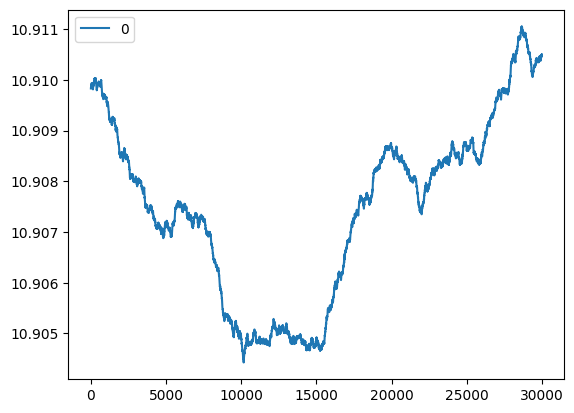

In [23]:
key, sub = jax.random.split(key)
xi = jft.random_like(sub, signal_response_tod.domain)
res = signal_response_tod(xi)
print(res.shape)

# for i in range(res.shape[0]):
# for i in range(0, n, n//10):
for i in [0]:
    plt.plot(np.arange(0, res.shape[1]), res[i], label=i)
plt.legend()
plt.show()

# MAP fit

In [24]:
n_it = 1
# delta = 1e-4 # default
# delta = 1e-8 # map
# tod
if noiselevel == 0.0: delta = 1e-4
elif noiselevel == 0.1: delta = 1e-10
elif noiselevel == 0.5: delta = 1e-10
elif noiselevel == 1.0: delta = 1e-4

n_samples = 0 # no samples -> maximum aposteriory posterior

key, k_i, k_o = random.split(key, 3)

samples, state = jft.optimize_kl(
    lh, # likelihood
    jft.Vector(lh.init(k_i)), # initial position in model space (initialisation)
    n_total_iterations=n_it, # no of optimisation steps (global)
    n_samples=n_samples, # draw samples
    key=k_o, # random jax init
    draw_linear_kwargs=dict( # sampling parameters
        cg_name="SL",
        cg_kwargs=dict(absdelta=delta * jft.size(lh.domain) / 10.0, maxiter=60),
    ),
    nonlinearly_update_kwargs=dict( # map from multivariate gaussian to more compl. distribution (coordinate transformations)
        minimize_kwargs=dict(
            name="SN",
            xtol=delta,
            cg_kwargs=dict(name=None),
            maxiter=5,
        )
    ),
    kl_kwargs=dict( # shift transformed multivar gauss to best match true posterior
        minimize_kwargs=dict(
            # name="M", xtol=delta, cg_kwargs=dict(name=None), maxiter=60 # map
            name="M", xtol=delta, cg_kwargs=dict(name=None), maxiter=20 # map
        )
    ),
    sample_mode="nonlinear_resample", # how steps are combined (samples + nonlin + KL)
)

OPTIMIZE_KL: Starting 0001
M: →:1.0 ↺:False #∇²:06 |↘|:2.766829e+02 ➽:1.040006e+02
M: Iteration 1 ⛰:+3.599523e+09 Δ⛰:6.469267e+10
M: →:1.0 ↺:False #∇²:12 |↘|:1.284174e+02 ➽:1.040006e+02
M: Iteration 2 ⛰:+3.506076e+08 Δ⛰:3.248916e+09
M: →:1.0 ↺:False #∇²:18 |↘|:5.175053e+01 ➽:1.040006e+02
M: Iteration 3 ⛰:+1.592432e+08 Δ⛰:1.913644e+08
OPTIMIZE_KL: Iteration 0001 ⛰:+1.5924e+08
OPTIMIZE_KL: #(KL minimization steps) 3
OPTIMIZE_KL: Likelihood residual(s):
'reduced χ²: 4.9e+01±     0.0, avg:     +0.2±     0.0, #dof:6510000'

OPTIMIZE_KL: Prior residual(s):
cfmapax1fluctuations    :: 'reduced χ²:    0.17±     0.0, avg:    -0.41±     0.0, #dof:      1'
cfmapax1loglogavgslope  :: 'reduced χ²:    0.29±     0.0, avg:    -0.54±     0.0, #dof:      1'
cfmapxi                 :: 'reduced χ²:     1.0±     0.0, avg: +0.00066±     0.0, #dof:1000000'
cfmapzeromode           :: 'reduced χ²:    0.17±     0.0, avg:    -0.41±     0.0, #dof:      1'
combcf tod fluctuations :: 'reduced χ²:   0.057±     0.0, a

In [25]:
samples.pos

Vector(
	{'cfmapax1fluctuations': Array(-0.40627239, dtype=float64),
	 'cfmapax1loglogavgslope': Array(-0.53577888, dtype=float64),
	 'cfmapxi': Array([[-1.03498947,  1.39407863,  0.90448561, ..., -1.01231331,
	         0.89795984, -1.41077514],
	       [-0.40751901,  2.13702245,  1.13295572, ..., -0.19147381,
	         0.09179569,  0.08603602],
	       [ 0.65125073,  1.01626689, -1.10002524, ...,  1.24555632,
	         0.518157  ,  1.33244907],
	       ...,
	       [-1.59261116, -0.26321808, -1.48765166, ..., -0.63237449,
	         1.63322586, -1.20375053],
	       [ 1.25126534,  0.65715501, -0.80110887, ...,  0.55296179,
	         0.34665112,  1.34939542],
	       [ 0.31141861,  0.34904134, -0.85649544, ...,  0.60737194,
	        -0.22888366, -0.42483704]], dtype=float64),
	 'cfmapzeromode': Array(-0.40877081, dtype=float64),
	 'combcf tod fluctuations': Array(-0.23835581, dtype=float64),
	 'combcf tod loglogavgslope': Array(2.08275367, dtype=float64),
	 'combcf xi': Array([[ -0.4353

In [26]:
def printfitresults():
    print("Fit Results (res, init, std)")

    print("\nTODs:")
    print(f"\tfluctuations: {jft.LogNormalPrior(*cf_fl_tod['fluctuations'])(samples.pos['combcf tod fluctuations'])}, {cf_fl_tod['fluctuations'][0]}, {cf_fl_tod['fluctuations'][1]}")
    print(f"\tloglogvarslope: {jft.NormalPrior(*cf_fl_tod['loglogavgslope'])(samples.pos['combcf tod loglogavgslope'])}, {cf_fl_tod['loglogavgslope'][0]}, {cf_fl_tod['loglogavgslope'][1]}")
    print(f"\tzeromode std (LogNormal): {jft.LogNormalPrior(*cf_zm_tod['offset_std'])(samples.pos['combcf zeromode'])}, {cf_zm_tod['offset_std'][0]}, {cf_zm_tod['offset_std'][1]}")
    
    print("map:")
    print(f"\tfluctuations: {jft.LogNormalPrior(*cf_fl_map['fluctuations'])(samples.pos['cfmapax1fluctuations'])}, {cf_fl_map['fluctuations'][0]}, {cf_fl_map['fluctuations'][1]}")
    print(f"\tloglogvarslope: {jft.NormalPrior(*cf_fl_map['loglogavgslope'])(samples.pos['cfmapax1loglogavgslope'])}, {cf_fl_map['loglogavgslope'][0]}, {cf_fl_map['loglogavgslope'][1]}")
    print(f"\tzeromode std (LogNormal): {jft.LogNormalPrior(*cf_zm_map['offset_std'])(samples.pos['cfmapzeromode'])}, {cf_zm_map['offset_std'][0]}, {cf_zm_map['offset_std'][1]}")
    
printfitresults()

Fit Results (res, init, std)

TODs:
	fluctuations: 0.001473108856061672, 0.0015, 0.0001
	loglogvarslope: -2.241724633335119, -2.45, 0.1
	zeromode std (LogNormal): 1.984593512776824e-06, 1e-05, 9.9e-06
map:
	fluctuations: 5.5586368014307646e-05, 5.6e-05, 1e-06
	loglogvarslope: -2.5535778883910853, -2.5, 0.1
	zeromode std (LogNormal): 4.1348641905692085e-10, 1e-08, 1e-07


(217, 30000)


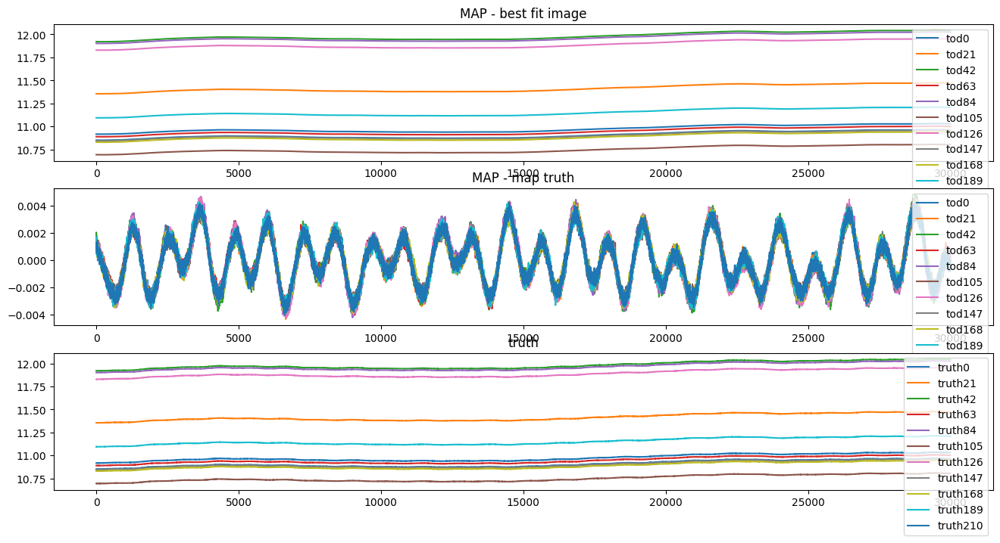

In [27]:
res = signal_response_tod(samples.pos)
print(res.shape)

fig, axes = plt.subplots(3, 1, figsize=(16, 8))

# for i in range(0, res.shape[0], res.shape[0]//10):
for i in range(0, n, n//10):
    im0 = axes[0].plot(np.arange(0, res.shape[1]), res[i], label=f"tod{i}")
    im1 = axes[1].plot(np.arange(0, res.shape[1]), res[i] - truth[i], label=f"tod{i}")
    im2 = axes[2].plot(truth[i], label=f"truth{i}")

axes[0].title.set_text('MAP - best fit image')
axes[0].legend()
axes[1].title.set_text('MAP - map truth')
axes[1].legend()
axes[2].title.set_text('truth')
axes[2].legend()

plt.show()

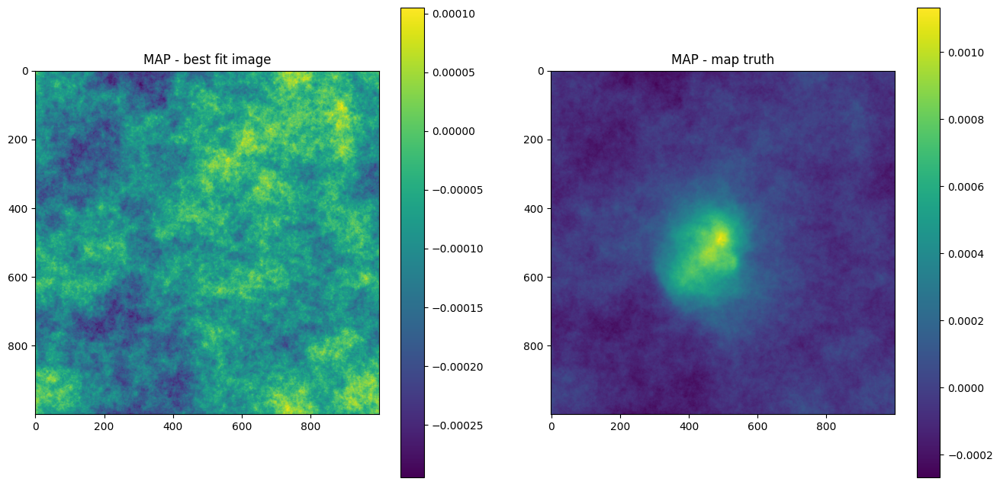

In [28]:
# plot maximum of posterior (mode)
# sig_map = gp_map(samples.pos)[padding_map//2:-padding_map//2, padding_map//2:-padding_map//2] # when splitting up in different field models
sig_map = gp_map(samples.pos)

fig, axes = plt.subplots(1, 2, figsize=(16, 8))

im0 = axes[0].imshow(sig_map)
axes[0].title.set_text('MAP - best fit image')
fig.colorbar(im0)

im1 = axes[1].imshow( sig_map - mapdata_truth[0, 0] )
axes[1].title.set_text('MAP - map truth')
# im1 = axes[1].imshow( (sig_map - mapdata_truth) )
# axes[1].title.set_text('diff prediction - map truth')
fig.colorbar(im1)

plt.show()

In [29]:
# assert False

## Full nifty fit:

OPTIMIZE_KL: Starting 0001
SL: Iteration 0 ⛰:+1.8895e+08 Δ⛰:inf ➽:1.0400e+01
SL: Iteration 1 ⛰:+1.9568e+07 Δ⛰:1.6938e+08 ➽:1.0400e+01
SL: Iteration 2 ⛰:+1.1791e+07 Δ⛰:7.7767e+06 ➽:1.0400e+01
SL: Iteration 3 ⛰:+5.0358e+06 Δ⛰:6.7555e+06 ➽:1.0400e+01
SL: Iteration 4 ⛰:+2.9310e+06 Δ⛰:2.1048e+06 ➽:1.0400e+01
SL: Iteration 5 ⛰:+2.2400e+06 Δ⛰:6.9094e+05 ➽:1.0400e+01
SL: Iteration 6 ⛰:+1.0378e+06 Δ⛰:1.2022e+06 ➽:1.0400e+01
SL: Iteration 7 ⛰:+5.4959e+05 Δ⛰:4.8825e+05 ➽:1.0400e+01
SL: Iteration 8 ⛰:+3.1538e+05 Δ⛰:2.3421e+05 ➽:1.0400e+01
SL: Iteration 9 ⛰:+1.6659e+05 Δ⛰:1.4878e+05 ➽:1.0400e+01
SL: Iteration 10 ⛰:+1.1890e+04 Δ⛰:1.5470e+05 ➽:1.0400e+01
SL: Iteration 11 ⛰:-4.6674e+03 Δ⛰:1.6557e+04 ➽:1.0400e+01
SL: Iteration 12 ⛰:-9.0717e+04 Δ⛰:8.6049e+04 ➽:1.0400e+01
SL: Iteration 13 ⛰:-1.6875e+05 Δ⛰:7.8031e+04 ➽:1.0400e+01
SL: Iteration 14 ⛰:-1.7090e+05 Δ⛰:2.1577e+03 ➽:1.0400e+01
SL: Iteration 15 ⛰:-2.0571e+05 Δ⛰:3.4802e+04 ➽:1.0400e+01
SL: Iteration 16 ⛰:-2.7017e+05 Δ⛰:6.4463e+04 ➽:1.0400e+01
SL: 

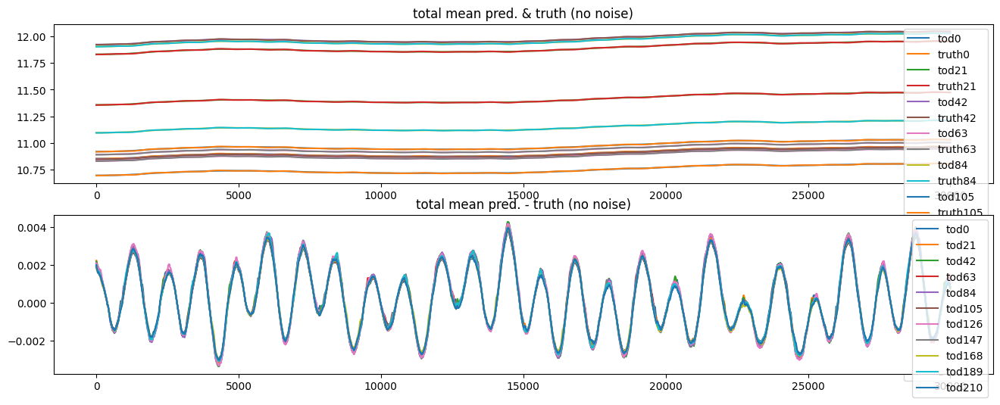

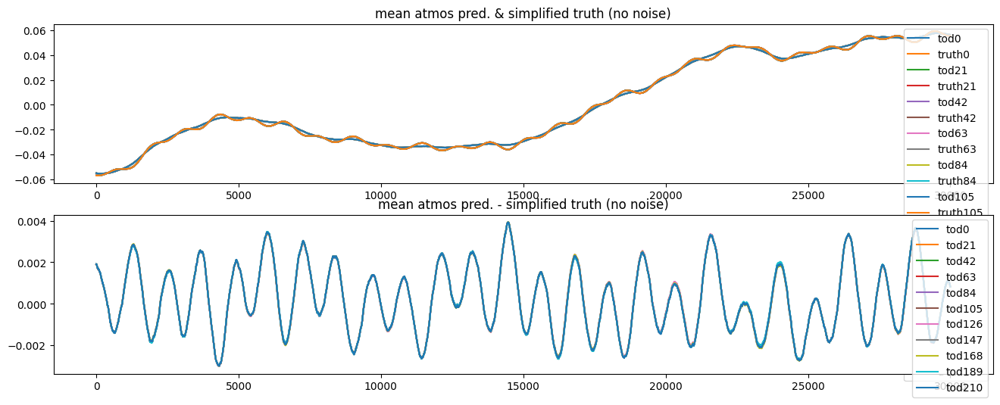

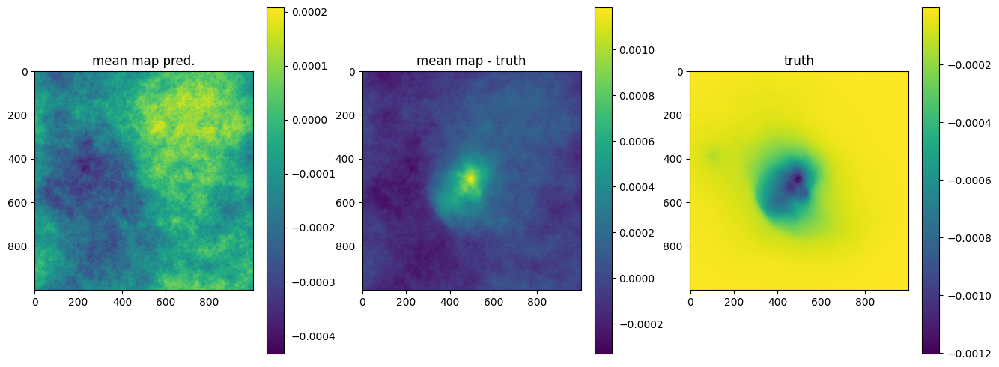

OPTIMIZE_KL: Starting 0003
SL: Iteration 0 ⛰:+1.2952e+08 Δ⛰:inf ➽:1.0400e+01
SL: Iteration 1 ⛰:+7.5744e+07 Δ⛰:5.3774e+07 ➽:1.0400e+01
SL: Iteration 2 ⛰:+2.7497e+07 Δ⛰:4.8247e+07 ➽:1.0400e+01
SL: Iteration 3 ⛰:+1.6128e+07 Δ⛰:1.1369e+07 ➽:1.0400e+01
SL: Iteration 4 ⛰:+4.3941e+06 Δ⛰:1.1734e+07 ➽:1.0400e+01
SL: Iteration 5 ⛰:+2.3813e+06 Δ⛰:2.0128e+06 ➽:1.0400e+01
SL: Iteration 6 ⛰:+1.2734e+06 Δ⛰:1.1079e+06 ➽:1.0400e+01
SL: Iteration 7 ⛰:+7.7303e+05 Δ⛰:5.0036e+05 ➽:1.0400e+01
SL: Iteration 8 ⛰:+3.4473e+05 Δ⛰:4.2830e+05 ➽:1.0400e+01
SL: Iteration 9 ⛰:+3.3985e+05 Δ⛰:4.8777e+03 ➽:1.0400e+01
SL: Iteration 10 ⛰:+1.7284e+05 Δ⛰:1.6701e+05 ➽:1.0400e+01
SL: Iteration 11 ⛰:+3.4933e+04 Δ⛰:1.3791e+05 ➽:1.0400e+01
SL: Iteration 12 ⛰:-6.6140e+04 Δ⛰:1.0107e+05 ➽:1.0400e+01
SL: Iteration 13 ⛰:-1.2430e+05 Δ⛰:5.8159e+04 ➽:1.0400e+01
SL: Iteration 14 ⛰:-1.3559e+05 Δ⛰:1.1288e+04 ➽:1.0400e+01
SL: Iteration 15 ⛰:-1.5446e+05 Δ⛰:1.8876e+04 ➽:1.0400e+01
SL: Iteration 16 ⛰:-1.8011e+05 Δ⛰:2.5651e+04 ➽:1.0400e+01
SL: 

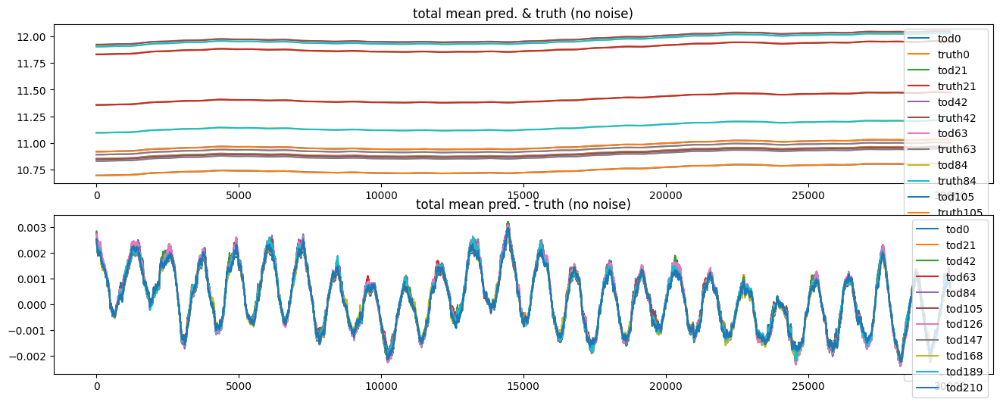

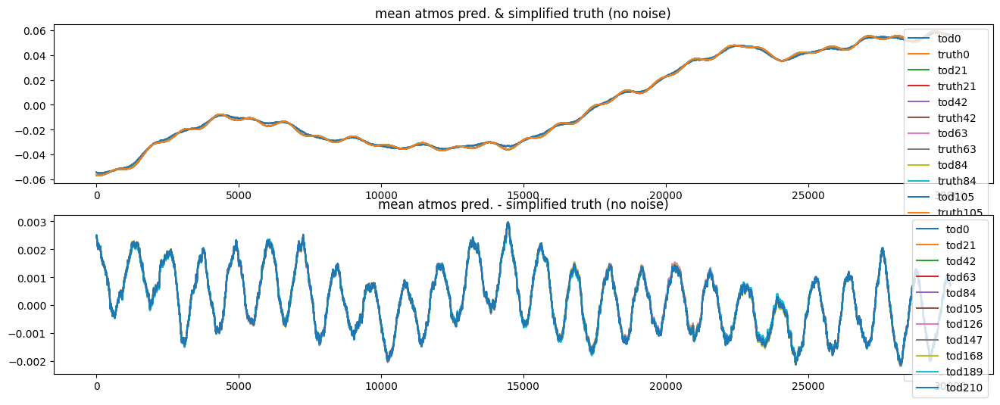

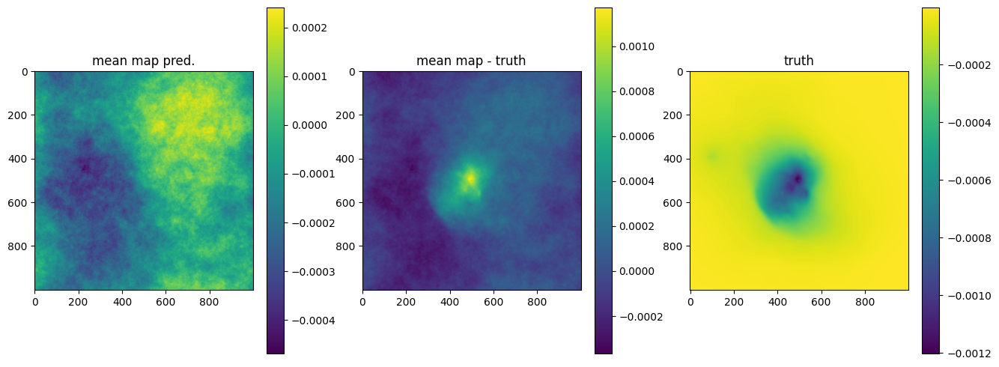

OPTIMIZE_KL: Starting 0005
SL: Iteration 0 ⛰:+1.3570e+08 Δ⛰:inf ➽:1.0400e+01
SL: Iteration 1 ⛰:+3.6150e+07 Δ⛰:9.9554e+07 ➽:1.0400e+01
SL: Iteration 2 ⛰:+1.9403e+07 Δ⛰:1.6747e+07 ➽:1.0400e+01
SL: Iteration 3 ⛰:+1.0405e+07 Δ⛰:8.9985e+06 ➽:1.0400e+01
SL: Iteration 4 ⛰:+7.6825e+06 Δ⛰:2.7223e+06 ➽:1.0400e+01
SL: Iteration 5 ⛰:+6.8026e+06 Δ⛰:8.7995e+05 ➽:1.0400e+01
SL: Iteration 6 ⛰:+5.2738e+06 Δ⛰:1.5288e+06 ➽:1.0400e+01
SL: Iteration 7 ⛰:+3.0702e+06 Δ⛰:2.2036e+06 ➽:1.0400e+01
SL: Iteration 8 ⛰:+1.8915e+06 Δ⛰:1.1787e+06 ➽:1.0400e+01
SL: Iteration 9 ⛰:+1.8609e+06 Δ⛰:3.0586e+04 ➽:1.0400e+01
SL: Iteration 10 ⛰:+1.4160e+06 Δ⛰:4.4490e+05 ➽:1.0400e+01
SL: Iteration 11 ⛰:+1.1835e+06 Δ⛰:2.3258e+05 ➽:1.0400e+01
SL: Iteration 12 ⛰:+8.9811e+05 Δ⛰:2.8534e+05 ➽:1.0400e+01
SL: Iteration 13 ⛰:+6.5617e+05 Δ⛰:2.4194e+05 ➽:1.0400e+01
SL: Iteration 14 ⛰:+6.3900e+05 Δ⛰:1.7170e+04 ➽:1.0400e+01
SL: Iteration 15 ⛰:+4.8349e+05 Δ⛰:1.5551e+05 ➽:1.0400e+01
SL: Iteration 16 ⛰:+4.6224e+05 Δ⛰:2.1255e+04 ➽:1.0400e+01
SL: 

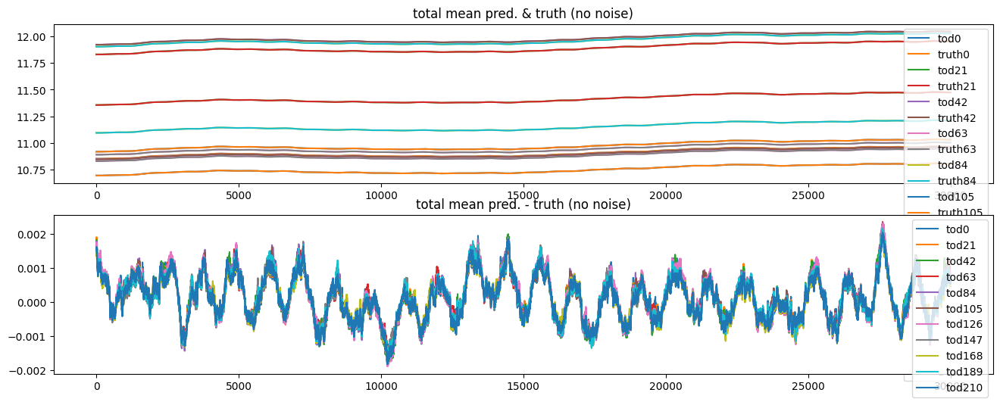

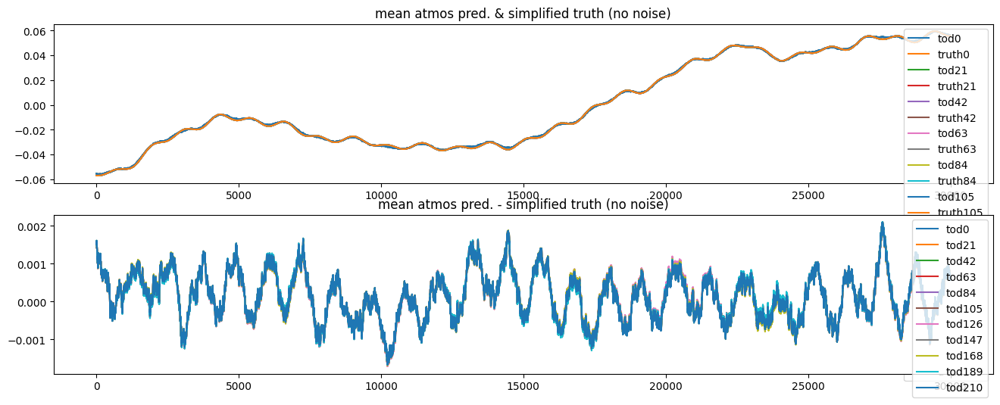

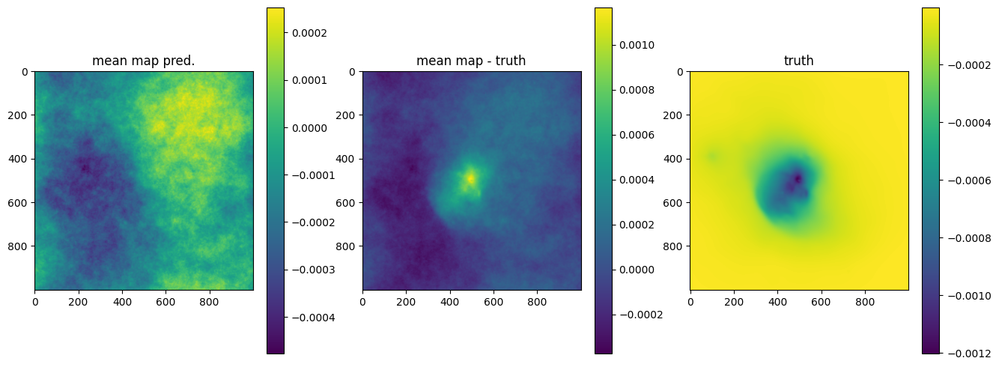

OPTIMIZE_KL: Starting 0007
SL: Iteration 0 ⛰:+2.2520e+08 Δ⛰:inf ➽:1.0400e+01
SL: Iteration 1 ⛰:+1.3887e+08 Δ⛰:8.6333e+07 ➽:1.0400e+01
SL: Iteration 2 ⛰:+2.5159e+07 Δ⛰:1.1371e+08 ➽:1.0400e+01
SL: Iteration 3 ⛰:+2.0410e+07 Δ⛰:4.7485e+06 ➽:1.0400e+01
SL: Iteration 4 ⛰:+1.3436e+07 Δ⛰:6.9738e+06 ➽:1.0400e+01
SL: Iteration 5 ⛰:+7.8718e+06 Δ⛰:5.5645e+06 ➽:1.0400e+01
SL: Iteration 6 ⛰:+4.9656e+06 Δ⛰:2.9062e+06 ➽:1.0400e+01
SL: Iteration 7 ⛰:+3.8211e+06 Δ⛰:1.1446e+06 ➽:1.0400e+01
SL: Iteration 8 ⛰:+2.9190e+06 Δ⛰:9.0210e+05 ➽:1.0400e+01
SL: Iteration 9 ⛰:+2.9031e+06 Δ⛰:1.5836e+04 ➽:1.0400e+01
SL: Iteration 10 ⛰:+2.4471e+06 Δ⛰:4.5602e+05 ➽:1.0400e+01
SL: Iteration 11 ⛰:+2.1904e+06 Δ⛰:2.5670e+05 ➽:1.0400e+01
SL: Iteration 12 ⛰:+1.9432e+06 Δ⛰:2.4721e+05 ➽:1.0400e+01
SL: Iteration 13 ⛰:+1.7203e+06 Δ⛰:2.2295e+05 ➽:1.0400e+01
SL: Iteration 14 ⛰:+1.3283e+06 Δ⛰:3.9194e+05 ➽:1.0400e+01
SL: Iteration 15 ⛰:+1.3107e+06 Δ⛰:1.7578e+04 ➽:1.0400e+01
SL: Iteration 16 ⛰:+1.2144e+06 Δ⛰:9.6321e+04 ➽:1.0400e+01
SL: 

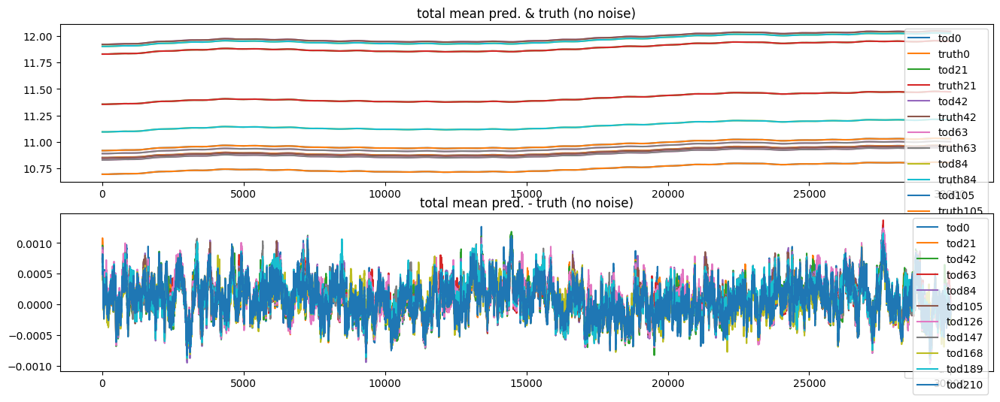

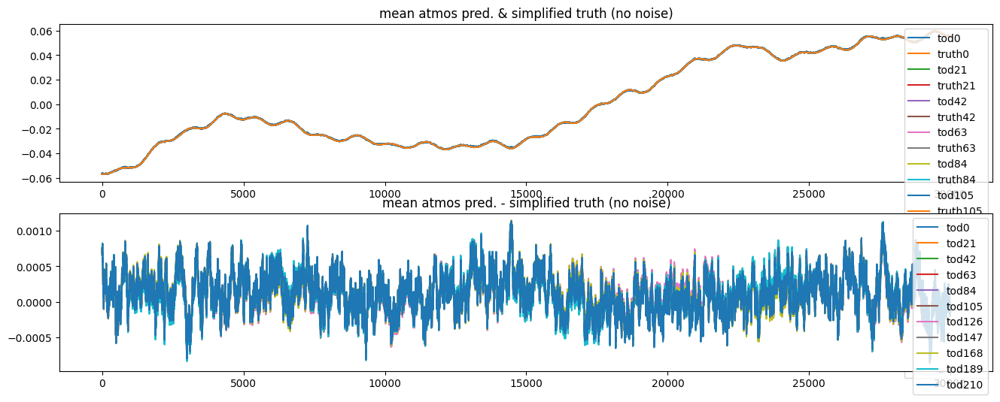

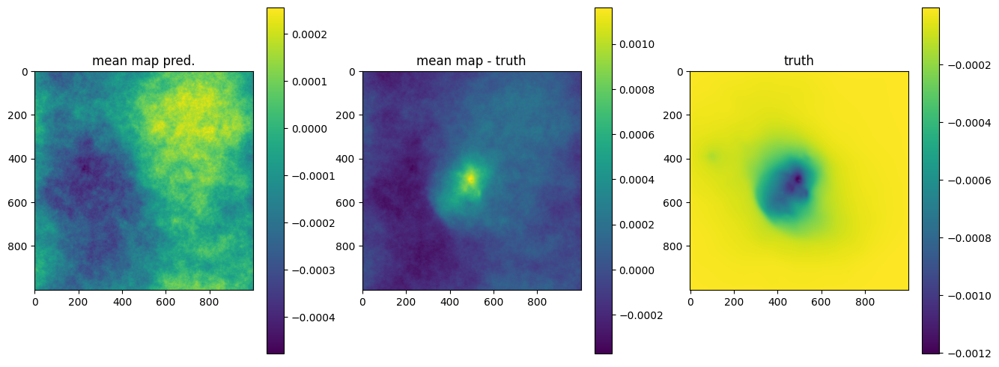

OPTIMIZE_KL: Starting 0009
SL: Iteration 0 ⛰:+3.3496e+08 Δ⛰:inf ➽:1.0400e+01
SL: Iteration 1 ⛰:+5.0369e+07 Δ⛰:2.8459e+08 ➽:1.0400e+01
SL: Iteration 2 ⛰:+3.0774e+07 Δ⛰:1.9595e+07 ➽:1.0400e+01
SL: Iteration 3 ⛰:+1.8893e+07 Δ⛰:1.1881e+07 ➽:1.0400e+01
SL: Iteration 4 ⛰:+1.1439e+07 Δ⛰:7.4540e+06 ➽:1.0400e+01
SL: Iteration 5 ⛰:+7.4062e+06 Δ⛰:4.0328e+06 ➽:1.0400e+01
SL: Iteration 6 ⛰:+6.1346e+06 Δ⛰:1.2716e+06 ➽:1.0400e+01
SL: Iteration 7 ⛰:+4.9781e+06 Δ⛰:1.1565e+06 ➽:1.0400e+01
SL: Iteration 8 ⛰:+4.1686e+06 Δ⛰:8.0948e+05 ➽:1.0400e+01
SL: Iteration 9 ⛰:+4.1581e+06 Δ⛰:1.0576e+04 ➽:1.0400e+01
SL: Iteration 10 ⛰:+3.2689e+06 Δ⛰:8.8919e+05 ➽:1.0400e+01
SL: Iteration 11 ⛰:+2.9879e+06 Δ⛰:2.8096e+05 ➽:1.0400e+01
SL: Iteration 12 ⛰:+2.4138e+06 Δ⛰:5.7412e+05 ➽:1.0400e+01
SL: Iteration 13 ⛰:+2.0827e+06 Δ⛰:3.3109e+05 ➽:1.0400e+01
SL: Iteration 14 ⛰:+1.7907e+06 Δ⛰:2.9206e+05 ➽:1.0400e+01
SL: Iteration 15 ⛰:+1.6373e+06 Δ⛰:1.5337e+05 ➽:1.0400e+01
SL: Iteration 16 ⛰:+1.5799e+06 Δ⛰:5.7377e+04 ➽:1.0400e+01
SL: 

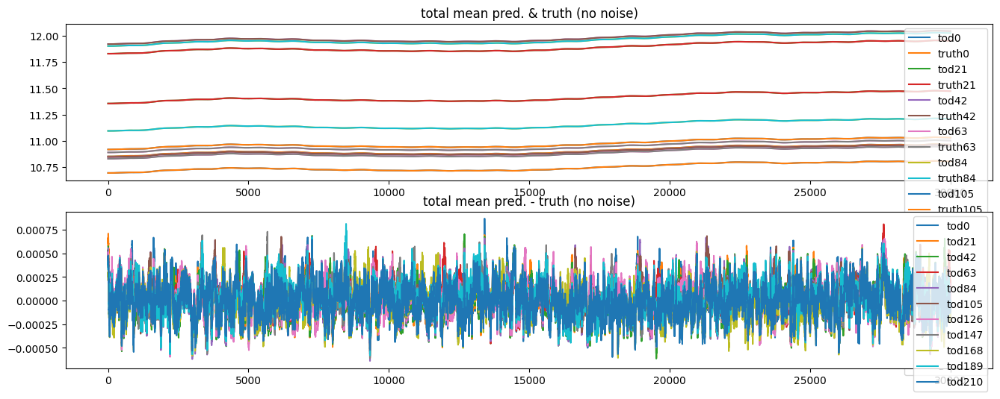

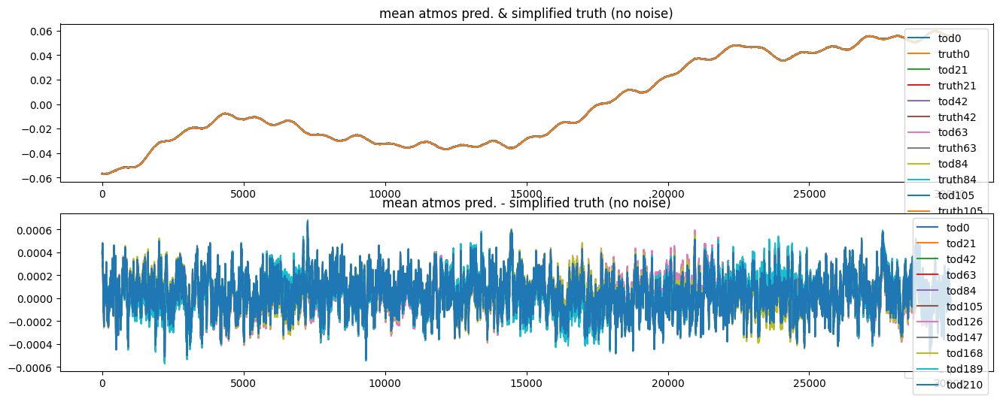

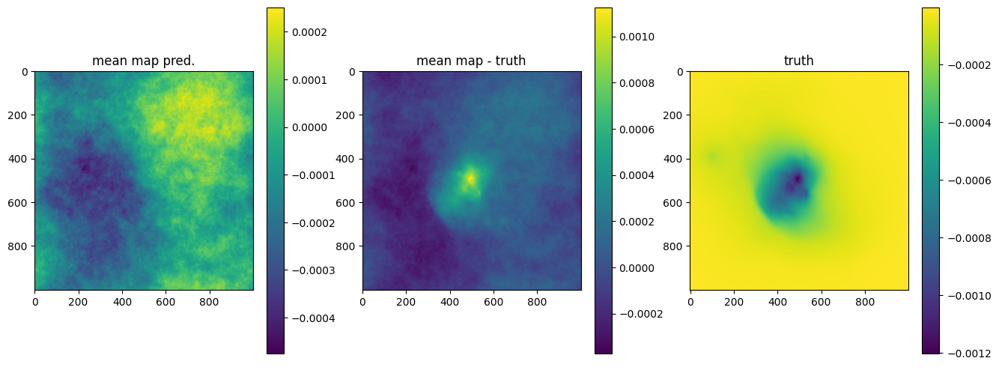

OPTIMIZE_KL: Starting 0011
SL: Iteration 0 ⛰:+1.3874e+08 Δ⛰:inf ➽:1.0400e+01
SL: Iteration 1 ⛰:+1.0629e+08 Δ⛰:3.2451e+07 ➽:1.0400e+01
SL: Iteration 2 ⛰:+1.9966e+07 Δ⛰:8.6325e+07 ➽:1.0400e+01
SL: Iteration 3 ⛰:+1.4641e+07 Δ⛰:5.3255e+06 ➽:1.0400e+01
SL: Iteration 4 ⛰:+8.3386e+06 Δ⛰:6.3020e+06 ➽:1.0400e+01
SL: Iteration 5 ⛰:+5.8484e+06 Δ⛰:2.4903e+06 ➽:1.0400e+01
SL: Iteration 6 ⛰:+4.4326e+06 Δ⛰:1.4157e+06 ➽:1.0400e+01
SL: Iteration 7 ⛰:+3.9012e+06 Δ⛰:5.3145e+05 ➽:1.0400e+01
SL: Iteration 8 ⛰:+3.0056e+06 Δ⛰:8.9554e+05 ➽:1.0400e+01
SL: Iteration 9 ⛰:+2.9999e+06 Δ⛰:5.7245e+03 ➽:1.0400e+01
SL: Iteration 10 ⛰:+2.5667e+06 Δ⛰:4.3318e+05 ➽:1.0400e+01
SL: Iteration 11 ⛰:+2.1559e+06 Δ⛰:4.1083e+05 ➽:1.0400e+01
SL: Iteration 12 ⛰:+1.7428e+06 Δ⛰:4.1314e+05 ➽:1.0400e+01
SL: Iteration 13 ⛰:+1.5881e+06 Δ⛰:1.5461e+05 ➽:1.0400e+01
SL: Iteration 14 ⛰:+1.5261e+06 Δ⛰:6.2000e+04 ➽:1.0400e+01
SL: Iteration 15 ⛰:+1.4415e+06 Δ⛰:8.4648e+04 ➽:1.0400e+01
SL: Iteration 16 ⛰:+1.4397e+06 Δ⛰:1.8385e+03 ➽:1.0400e+01
SL: 

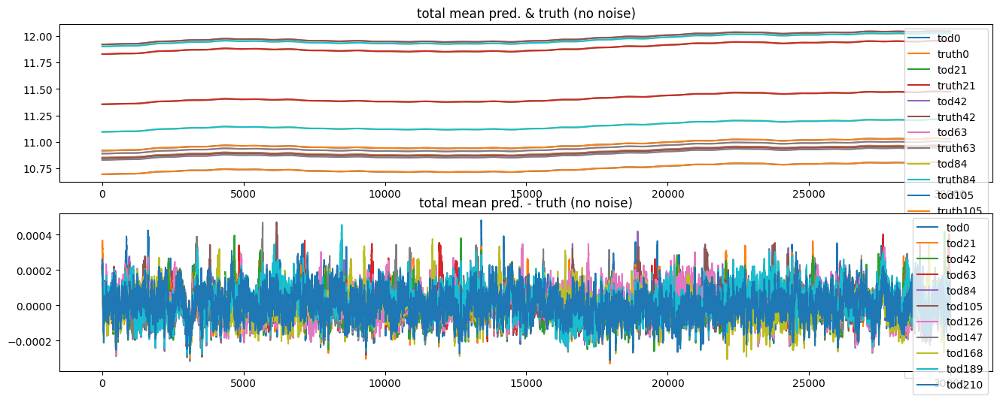

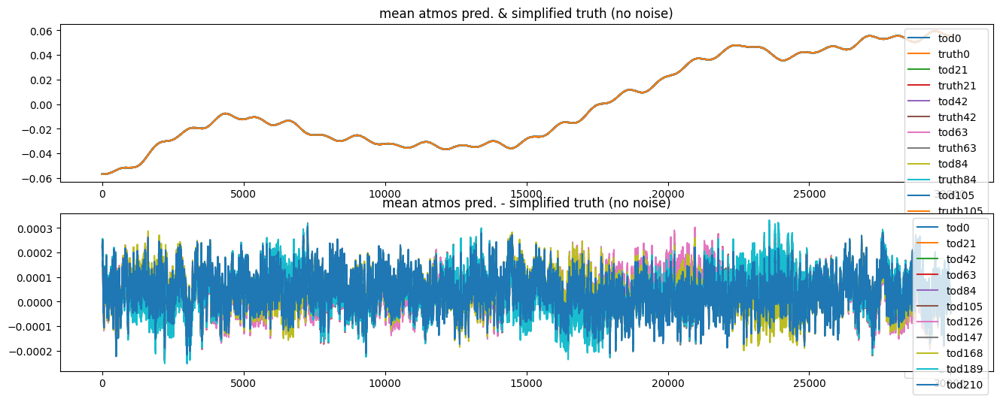

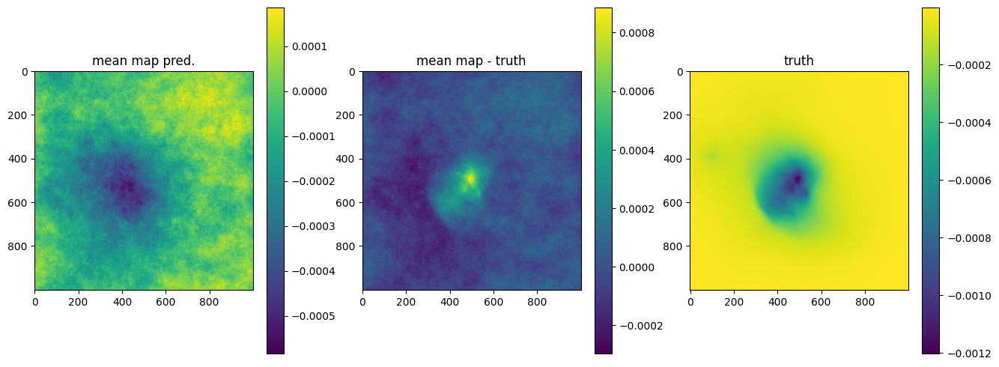

OPTIMIZE_KL: Starting 0013
SL: Iteration 0 ⛰:+7.7942e+07 Δ⛰:inf ➽:1.0400e+01
SL: Iteration 1 ⛰:+5.0216e+07 Δ⛰:2.7727e+07 ➽:1.0400e+01
SL: Iteration 2 ⛰:+3.2591e+07 Δ⛰:1.7625e+07 ➽:1.0400e+01
SL: Iteration 3 ⛰:+1.0981e+07 Δ⛰:2.1610e+07 ➽:1.0400e+01
SL: Iteration 4 ⛰:+8.6043e+06 Δ⛰:2.3771e+06 ➽:1.0400e+01
SL: Iteration 5 ⛰:+4.7827e+06 Δ⛰:3.8215e+06 ➽:1.0400e+01
SL: Iteration 6 ⛰:+3.1061e+06 Δ⛰:1.6766e+06 ➽:1.0400e+01
SL: Iteration 7 ⛰:+2.5494e+06 Δ⛰:5.5672e+05 ➽:1.0400e+01
SL: Iteration 8 ⛰:+1.7759e+06 Δ⛰:7.7344e+05 ➽:1.0400e+01
SL: Iteration 9 ⛰:+1.7564e+06 Δ⛰:1.9540e+04 ➽:1.0400e+01
SL: Iteration 10 ⛰:+1.3130e+06 Δ⛰:4.4338e+05 ➽:1.0400e+01
SL: Iteration 11 ⛰:+1.0806e+06 Δ⛰:2.3239e+05 ➽:1.0400e+01
SL: Iteration 12 ⛰:+9.0810e+05 Δ⛰:1.7253e+05 ➽:1.0400e+01
SL: Iteration 13 ⛰:+6.1152e+05 Δ⛰:2.9657e+05 ➽:1.0400e+01
SL: Iteration 14 ⛰:+6.0507e+05 Δ⛰:6.4517e+03 ➽:1.0400e+01
SL: Iteration 15 ⛰:+4.0866e+05 Δ⛰:1.9641e+05 ➽:1.0400e+01
SL: Iteration 16 ⛰:+4.0809e+05 Δ⛰:5.6588e+02 ➽:1.0400e+01
SL: 

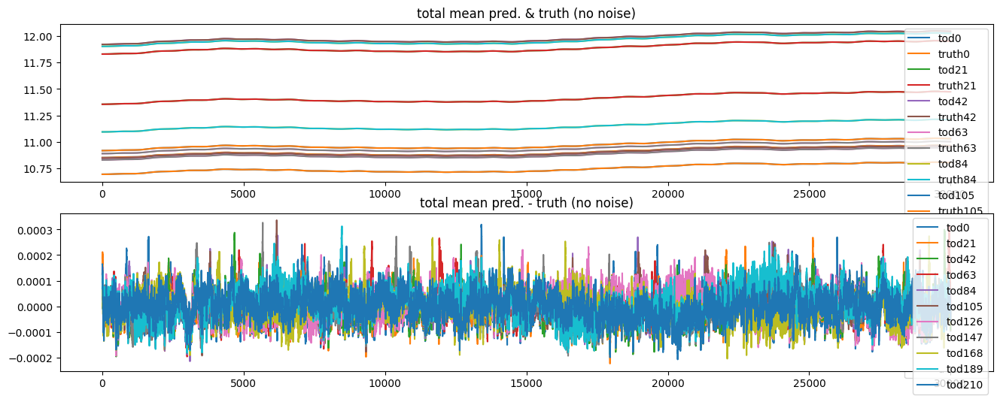

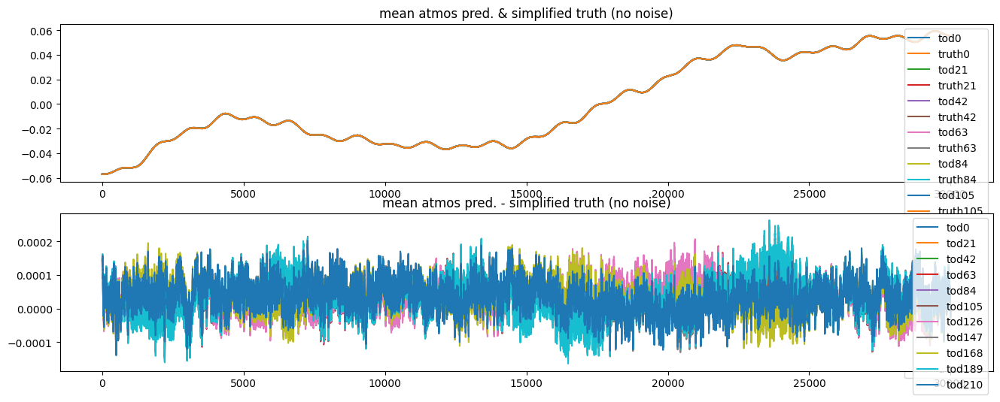

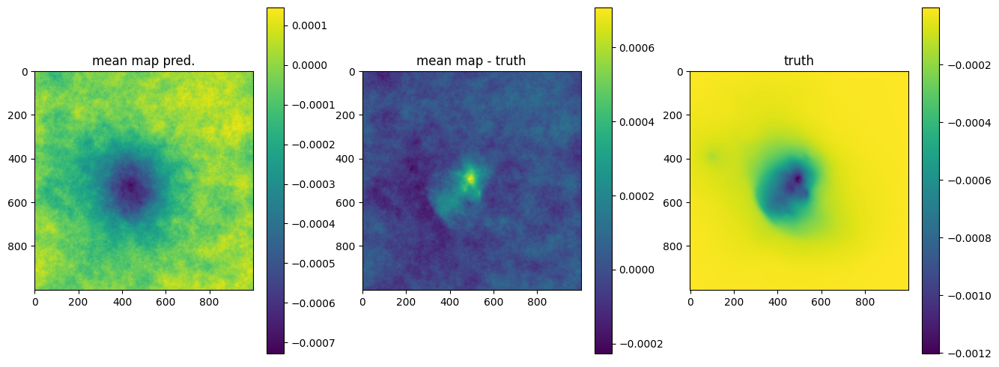

OPTIMIZE_KL: Starting 0015
SL: Iteration 0 ⛰:+5.7962e+07 Δ⛰:inf ➽:1.0400e+01
SL: Iteration 1 ⛰:+4.3160e+07 Δ⛰:1.4803e+07 ➽:1.0400e+01
SL: Iteration 2 ⛰:+2.1931e+07 Δ⛰:2.1229e+07 ➽:1.0400e+01
SL: Iteration 3 ⛰:+1.1800e+07 Δ⛰:1.0130e+07 ➽:1.0400e+01
SL: Iteration 4 ⛰:+6.4820e+06 Δ⛰:5.3184e+06 ➽:1.0400e+01
SL: Iteration 5 ⛰:+3.2320e+06 Δ⛰:3.2500e+06 ➽:1.0400e+01
SL: Iteration 6 ⛰:+2.3565e+06 Δ⛰:8.7549e+05 ➽:1.0400e+01
SL: Iteration 7 ⛰:+1.9205e+06 Δ⛰:4.3600e+05 ➽:1.0400e+01
SL: Iteration 8 ⛰:+1.4071e+06 Δ⛰:5.1338e+05 ➽:1.0400e+01
SL: Iteration 9 ⛰:+1.4016e+06 Δ⛰:5.5151e+03 ➽:1.0400e+01
SL: Iteration 10 ⛰:+9.7920e+05 Δ⛰:4.2242e+05 ➽:1.0400e+01
SL: Iteration 11 ⛰:+7.4876e+05 Δ⛰:2.3044e+05 ➽:1.0400e+01
SL: Iteration 12 ⛰:+5.2114e+05 Δ⛰:2.2762e+05 ➽:1.0400e+01
SL: Iteration 13 ⛰:+4.5421e+05 Δ⛰:6.6923e+04 ➽:1.0400e+01
SL: Iteration 14 ⛰:+2.4164e+05 Δ⛰:2.1258e+05 ➽:1.0400e+01
SL: Iteration 15 ⛰:+2.0212e+05 Δ⛰:3.9515e+04 ➽:1.0400e+01
SL: Iteration 16 ⛰:+9.2140e+04 Δ⛰:1.0998e+05 ➽:1.0400e+01
SL: 

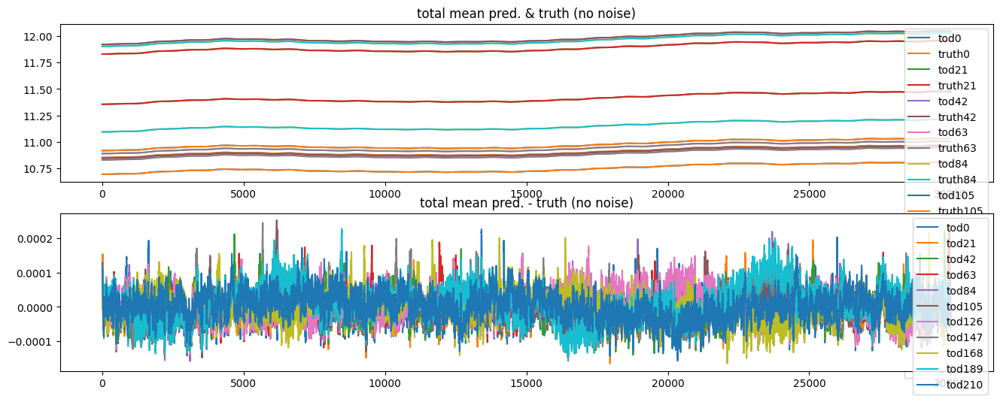

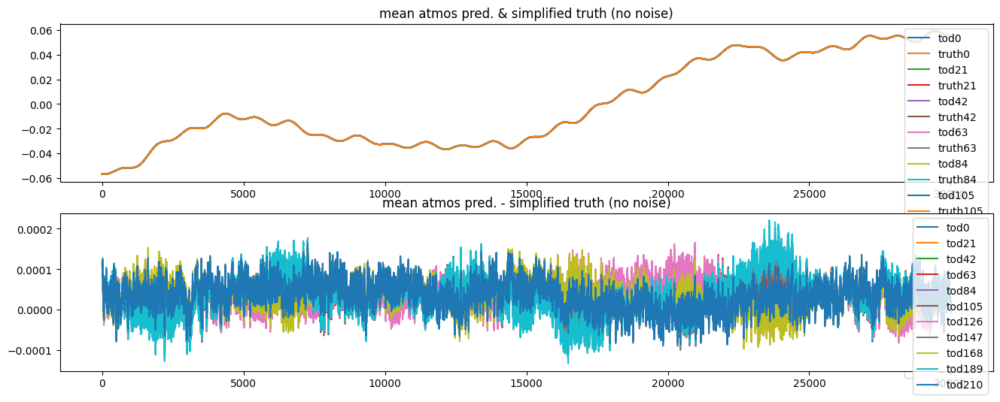

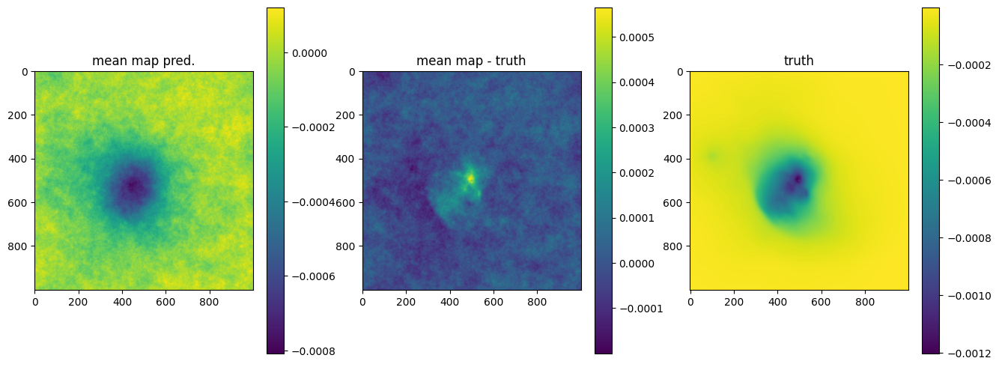

OPTIMIZE_KL: Starting 0017
SL: Iteration 0 ⛰:+1.2617e+09 Δ⛰:inf ➽:1.0400e+01
SL: Iteration 1 ⛰:+1.8678e+07 Δ⛰:1.2430e+09 ➽:1.0400e+01
SL: Iteration 2 ⛰:+7.3926e+06 Δ⛰:1.1285e+07 ➽:1.0400e+01
SL: Iteration 3 ⛰:+5.6010e+06 Δ⛰:1.7917e+06 ➽:1.0400e+01
SL: Iteration 4 ⛰:+2.8618e+06 Δ⛰:2.7392e+06 ➽:1.0400e+01
SL: Iteration 5 ⛰:+2.0531e+06 Δ⛰:8.0875e+05 ➽:1.0400e+01
SL: Iteration 6 ⛰:+1.4760e+06 Δ⛰:5.7711e+05 ➽:1.0400e+01
SL: Iteration 7 ⛰:+1.0166e+06 Δ⛰:4.5939e+05 ➽:1.0400e+01
SL: Iteration 8 ⛰:+1.0119e+06 Δ⛰:4.6667e+03 ➽:1.0400e+01
SL: Iteration 9 ⛰:+6.0571e+05 Δ⛰:4.0618e+05 ➽:1.0400e+01
SL: Iteration 10 ⛰:+4.5603e+05 Δ⛰:1.4968e+05 ➽:1.0400e+01
SL: Iteration 11 ⛰:+1.8091e+05 Δ⛰:2.7512e+05 ➽:1.0400e+01
SL: Iteration 12 ⛰:+4.3759e+04 Δ⛰:1.3715e+05 ➽:1.0400e+01
SL: Iteration 13 ⛰:+2.7945e+04 Δ⛰:1.5814e+04 ➽:1.0400e+01
SL: Iteration 14 ⛰:-5.4567e+04 Δ⛰:8.2512e+04 ➽:1.0400e+01
SL: Iteration 15 ⛰:-5.4836e+04 Δ⛰:2.6870e+02 ➽:1.0400e+01
SL: Iteration 16 ⛰:-1.0120e+05 Δ⛰:4.6361e+04 ➽:1.0400e+01
SL: 

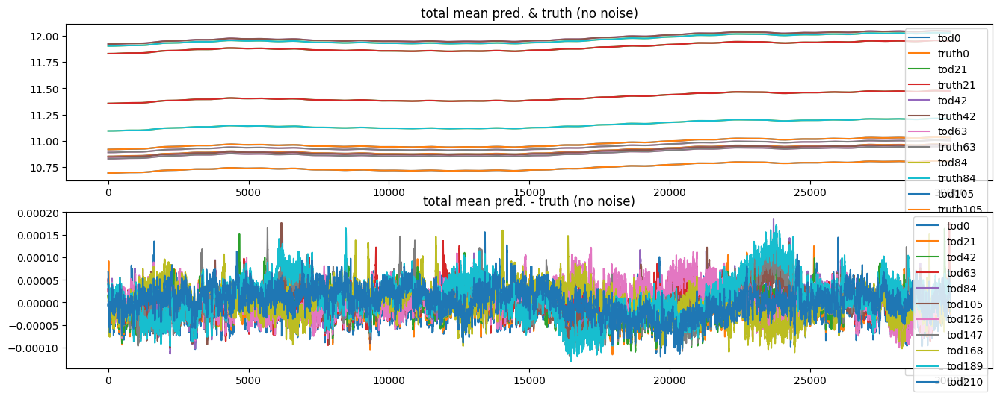

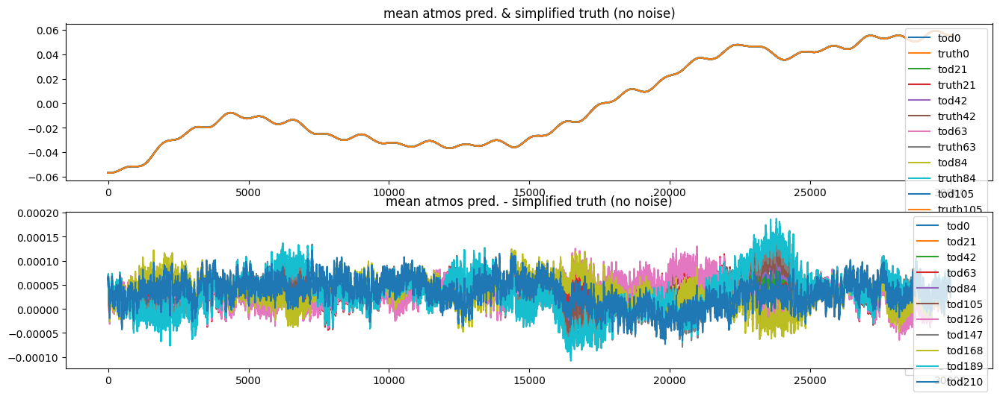

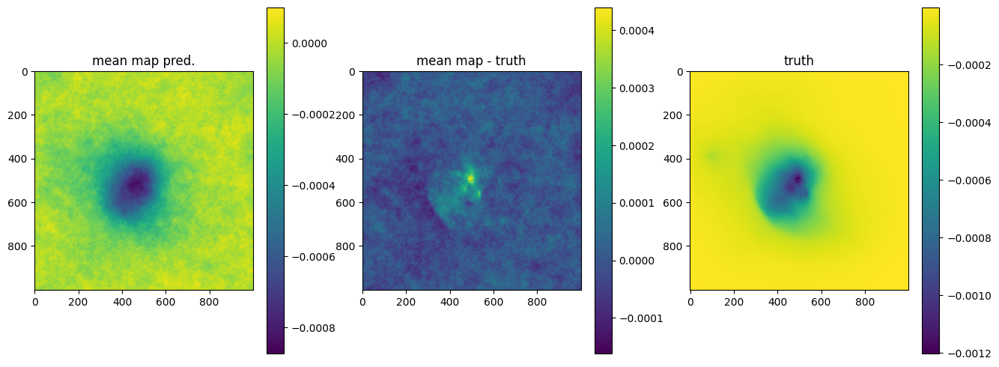

OPTIMIZE_KL: Starting 0019
SL: Iteration 0 ⛰:+3.3122e+07 Δ⛰:inf ➽:1.0400e+01
SL: Iteration 1 ⛰:+1.0520e+07 Δ⛰:2.2602e+07 ➽:1.0400e+01
SL: Iteration 2 ⛰:+8.5467e+06 Δ⛰:1.9732e+06 ➽:1.0400e+01
SL: Iteration 3 ⛰:+6.2410e+06 Δ⛰:2.3058e+06 ➽:1.0400e+01
SL: Iteration 4 ⛰:+2.9953e+06 Δ⛰:3.2457e+06 ➽:1.0400e+01
SL: Iteration 5 ⛰:+1.6509e+06 Δ⛰:1.3444e+06 ➽:1.0400e+01
SL: Iteration 6 ⛰:+1.0578e+06 Δ⛰:5.9310e+05 ➽:1.0400e+01
SL: Iteration 7 ⛰:+4.9599e+05 Δ⛰:5.6179e+05 ➽:1.0400e+01
SL: Iteration 8 ⛰:+2.4772e+05 Δ⛰:2.4827e+05 ➽:1.0400e+01
SL: Iteration 9 ⛰:+2.2210e+05 Δ⛰:2.5625e+04 ➽:1.0400e+01
SL: Iteration 10 ⛰:+8.1664e+04 Δ⛰:1.4043e+05 ➽:1.0400e+01
SL: Iteration 11 ⛰:-4.4191e+04 Δ⛰:1.2585e+05 ➽:1.0400e+01
SL: Iteration 12 ⛰:-1.2059e+05 Δ⛰:7.6399e+04 ➽:1.0400e+01
SL: Iteration 13 ⛰:-1.2367e+05 Δ⛰:3.0778e+03 ➽:1.0400e+01
SL: Iteration 14 ⛰:-1.9863e+05 Δ⛰:7.4964e+04 ➽:1.0400e+01
SL: Iteration 15 ⛰:-2.1139e+05 Δ⛰:1.2756e+04 ➽:1.0400e+01
SL: Iteration 16 ⛰:-2.4807e+05 Δ⛰:3.6678e+04 ➽:1.0400e+01
SL: 

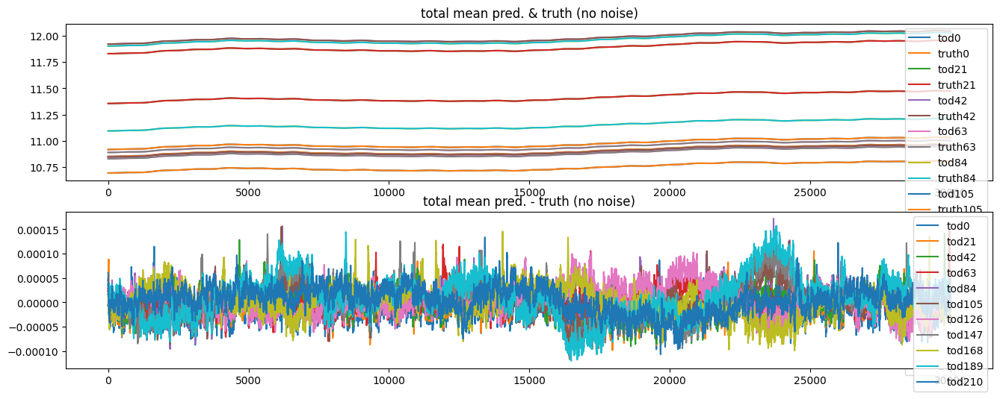

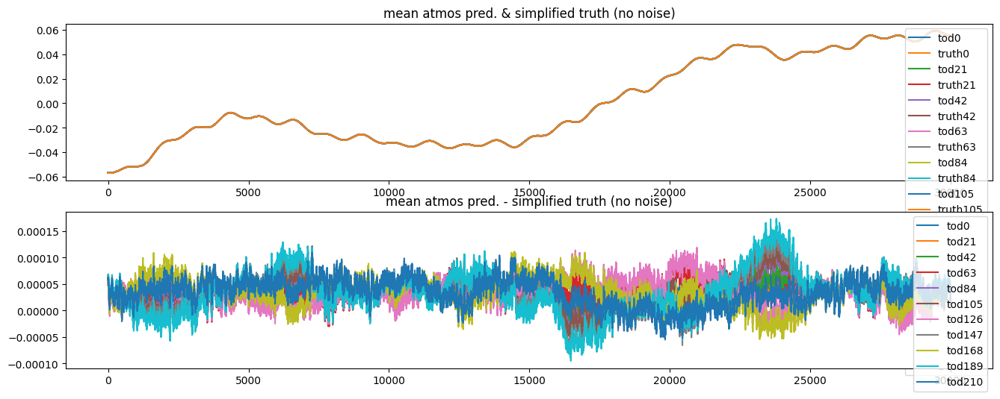

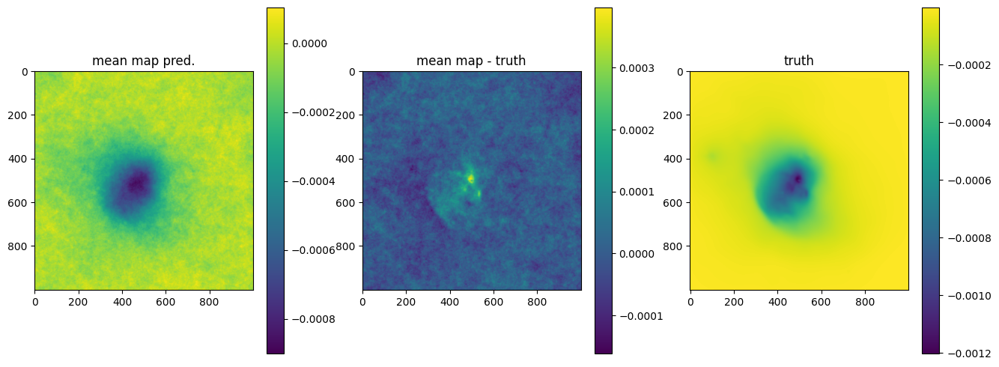

In [30]:
n_it = 20

if noiselevel == 0.0: delta = 1e-4
elif noiselevel == 0.1: delta = 1e-10
elif noiselevel == 0.5: delta = 1e-10
elif noiselevel == 1.0: delta = 1e-4
n_samples = 4 # no samples -> maximum aposteriory posterior

key, k_i, k_o = random.split(key, 3)

# callback fn for plotting during optimisation:
def callback(samples, opt_state):
    iter = opt_state[0]
    printevery = 2 #10
    if iter % printevery != 0: return

    fig_tods, axes_tods = plt.subplots(2, 1, figsize=(16, 6))
    mean, std = jft.mean_and_std(tuple(signal_response_tod(s) for s in samples))

    for i in range(0, n, n//10):
        axes_tods[0].plot(np.arange(0, mean.shape[1]), mean[i], label=f"tod{i}")
        axes_tods[0].plot(denoised_jax_tod[i], label=f"truth{i}")
        axes_tods[1].plot(np.arange(0, mean.shape[1]), mean[i] - denoised_jax_tod[i], label=f"tod{i}")
        # axes_tods[0].plot(denoised_jax_tod[i, 100:-100], label=f"truth{i}")
        # axes_tods[1].plot(np.arange(0, mean.shape[1]), mean[i] - denoised_jax_tod[i, 100:-100], label=f"tod{i}")

    axes_tods[0].title.set_text('total mean pred. & truth (no noise)')
    axes_tods[0].legend()
    axes_tods[1].title.set_text('total mean pred. - truth (no noise)')
    axes_tods[1].legend()

    fig_tods, axes_tods = plt.subplots(2, 1, figsize=(16, 6))

    preds = []
    for x in samples:
        x_tod = {k: x[k] for k in x if 'comb' in k}
        res_tods = gp_tod(x_tod)

        # From TOD-only fit:
        # preds += [res_tods[:, padding_atmos//2:-padding_atmos//2] * slopes_truth[:, None] + offset_tod_truth[:, None], ]
        preds += [res_tods[:, padding_atmos//2:-padding_atmos//2], ]

    mean_atmos, std = jft.mean_and_std(tuple(preds))

    for i in range(0, n, n//10):
        axes_tods[0].plot(np.arange(0, mean_atmos.shape[1]), mean_atmos[i], label=f"tod{i}")
        # axes_tods[0].plot(denoised_jax_tod[i], label=f"truth{i}")
        axes_tods[0].plot(atmos_tod_simplified[i], label=f"truth{i}")
        axes_tods[1].plot(np.arange(0, mean_atmos.shape[1]), mean_atmos[i] - atmos_tod_simplified[i], label=f"tod{i}")
        # axes_tods[1].plot(np.arange(0, mean_atmos.shape[1]), mean[i] - mean_atmos[i], label=f"tod{i}")

    axes_tods[0].title.set_text('mean atmos pred. & simplified truth (no noise)')
    axes_tods[0].legend()
    axes_tods[1].title.set_text('mean atmos pred. - simplified truth (no noise)')
    axes_tods[1].legend()

    fig_map, axes_map = plt.subplots(1, 3, figsize=(16, 6))

    # mean_map, _ = jft.mean_and_std(tuple(gp_map(s)[padding_map//2:-padding_map//2, padding_map//2:-padding_map//2] for s in samples))
    mean_map, _ = jft.mean_and_std(tuple(gp_map(s) for s in samples))

    im0 = axes_map[0].imshow(mean_map)
    axes_map[0].title.set_text('mean map pred.')
    fig_map.colorbar(im0)

    im1 = axes_map[1].imshow(mean_map - mapdata_truth[0, 0])
    axes_map[1].title.set_text('mean map - truth')
    fig_map.colorbar(im1)

    im2 = axes_map[2].imshow(mapdata_truth[0, 0])
    axes_map[2].title.set_text('truth')
    fig_map.colorbar(im2)

    plt.show()
    

samples, state = jft.optimize_kl(
    lh, # likelihood
    jft.Vector(lh.init(k_i)), # initial position in model space (initialisation)
    n_total_iterations=n_it, # no of optimisation steps (global)
    n_samples=n_samples, # draw samples
    key=k_o, # random jax init
    draw_linear_kwargs=dict( # sampling parameters
        cg_name="SL",
        # cg_kwargs=dict(absdelta=delta * jft.size(lh.domain) / 10.0, maxiter=60),
        cg_kwargs=dict(absdelta=delta * jft.size(lh.domain) / 10.0, maxiter=20),
    ),
    nonlinearly_update_kwargs=dict( # map from multivariate gaussian to more compl. distribution (coordinate transformations)
        minimize_kwargs=dict(
            name="SN",
            xtol=delta,
            cg_kwargs=dict(name=None),
            maxiter=5,
        )
    ),
    kl_kwargs=dict( # shift transformed multivar gauss to best match true posterior
        minimize_kwargs=dict(
            # name="M", xtol=delta, cg_kwargs=dict(name=None), maxiter=60
            name="M", xtol=delta, cg_kwargs=dict(name=None), maxiter=20
        )
    ),
    # sample_mode="nonlinear_resample", # how steps are combined (samples + nonlin + KL)
    sample_mode = lambda x: "nonlinear_resample" if x >= 1 else "linear_resample",
    callback=callback,
)

In [31]:
printfitresults()

Fit Results (res, init, std)

TODs:
	fluctuations: 0.0008999073133412199, 0.0015, 0.0001
	loglogvarslope: -2.3274250177452664, -2.45, 0.1
	zeromode std (LogNormal): 2.637157430008325e-06, 1e-05, 9.9e-06
map:
	fluctuations: 4.3823653633601105e-05, 5.6e-05, 1e-06
	loglogvarslope: -2.4028904068486994, -2.5, 0.1
	zeromode std (LogNormal): 3.497095039776303e-09, 1e-08, 1e-07


In [32]:
from maria.mappers import BinMapper

mapper = BinMapper(center=(150, 10),
                   frame="ra_dec",
                   width=0.1,
                   height=0.1,
                   resolution=2e-4,
                   tod_preprocessing={
                        "window": {"name": "hamming"},
                        "remove_modes": {"modes_to_remove": [0]},
                        "despline": {"knot_spacing": 10},
                    },
                    map_postprocessing={
                        "gaussian_filter": {"sigma": 1},
                        "median_filter": {"size": 1},
                    },
                  )

mapper.add_tods(tod_truthmap)
output_map = mapper.run()

Running mapper (m2/f093): 100%|██████████| 1/1 [00:07<00:00,  7.81s/it]


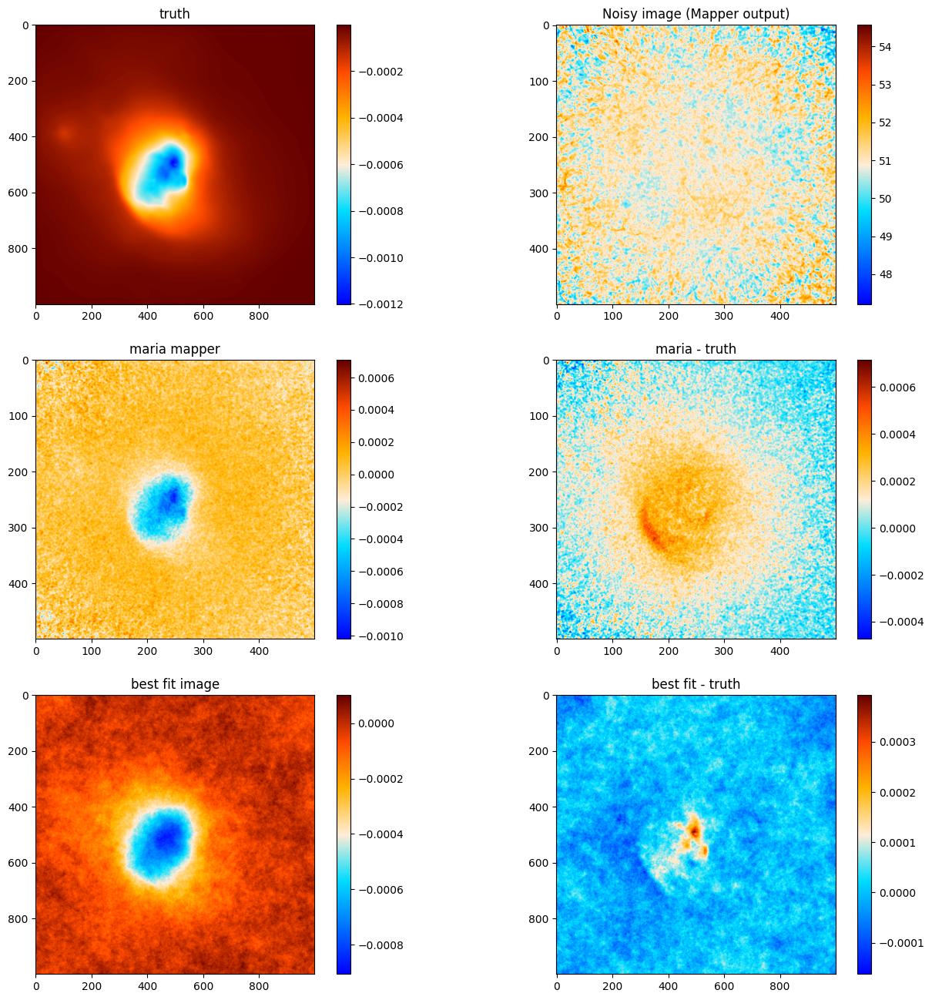

In [33]:
from skimage.transform import resize

# Compare nifty vs maria
# sig_map = gp_map(samples.pos)[padding_map//2:-padding_map//2, padding_map//2:-padding_map//2] # when splitting up in different field models
sig_map = gp_map(samples.pos)
# mincol = -0.0012
# maxcol = 0.
mincol = None
maxcol = None

cmb_cmap = plt.get_cmap('cmb')
fig, axes = plt.subplots(3, 2, figsize=(16, 16))

im0 = axes[0,0].imshow( mapdata_truth[0,0] , cmap=cmb_cmap, vmin=mincol, vmax=maxcol)
axes[0,0].title.set_text('truth')
fig.colorbar(im0)

im1 = axes[0,1].imshow(output_truthmap.data[0,0], cmap=cmb_cmap, vmin=mincol, vmax=maxcol)
fig.colorbar(im1)
axes[0,1].title.set_text("Noisy image (Mapper output)")

im2 = axes[1,0].imshow(output_map.data[0, 0], cmap=cmb_cmap, vmin=mincol, vmax=maxcol)
axes[1,0].title.set_text('maria mapper')
fig.colorbar(im2)

truth_rescaled = resize(mapdata_truth[0,0], (500, 500), anti_aliasing=True)
im3 = axes[1,1].imshow((output_map.data[0, 0] - truth_rescaled), cmap=cmb_cmap, vmin=mincol, vmax=maxcol)
axes[1,1].title.set_text('maria - truth')
fig.colorbar(im3)

im3 = axes[2,0].imshow(sig_map, cmap=cmb_cmap, vmin=mincol, vmax=maxcol)
axes[2,0].title.set_text('best fit image')
fig.colorbar(im3)

im4 = axes[2,1].imshow((sig_map - mapdata_truth[0,0]), cmap=cmb_cmap, vmin=mincol, vmax=maxcol)
axes[2,1].title.set_text('best fit - truth')
fig.colorbar(im4)

plt.show()

In [34]:
assert False

AssertionError: 

# Extended Model:

In [ ]:
samples.pos
initial_pos = {}
for k in samples.pos:
    if k == 'combcf xi':
        initial_pos[k] = jax.numpy.broadcast_to(samples.pos['combcf xi'], (n, samples.pos['combcf xi'].shape[1]))
    else:
        initial_pos[k] = samples.pos[k]

initial_pos = jft.Vector(initial_pos)

print(initial_pos)
initial_pos['combcf xi'].shape

Vector(
	{'cfmapax1fluctuations': Array(-18.77953014, dtype=float64),
	 'cfmapax1loglogavgslope': Array(2.09593472, dtype=float64),
	 'cfmapxi': Array([[ 0.60442972,  7.06301436, -6.48333553, ..., -0.82613501,
	        -2.01355903,  1.76185967],
	       [ 4.3200224 , -7.82485724,  6.04757499, ...,  1.18341018,
	         0.74592646, -1.33037264],
	       [-2.73198684,  2.83332048, -5.64252887, ..., -0.51455989,
	         1.3820068 ,  0.33056739],
	       ...,
	       [ 2.10433046, -1.83979229,  0.51730564, ..., -2.39639613,
	         2.83832068, -3.97740309],
	       [-4.93616268,  6.30592715, -3.83052807, ...,  1.14184563,
	        -3.95987716,  3.18669606],
	       [ 7.4418934 , -8.88944144,  7.20515814, ..., -0.25148248,
	         2.85926476, -6.13165213]], dtype=float64),
	 'cfmapzeromode': Array(0.60884396, dtype=float64),
	 'combcf tod fluctuations': Array(-6.22077419, dtype=float64),
	 'combcf tod loglogavgslope': Array(-1.43655183, dtype=float64),
	 'combcf xi': Array([[  0.1527

(217, 40000)

In [ ]:
# put together in correlated field model
# Custom CFM:
cfm_tod = CFM("combcf ")
cfm_tod.set_amplitude_total_offset(**cf_zm_tod)
cfm_tod.add_fluctuations(
    dims_atmos, distances=1.0 / dims_atmos[0], **cf_fl_tod, prefix="tod ", non_parametric_kind="power"
)
gp_tod = cfm_tod.finalize(n)
# gp_tod = cfm_tod.finalize(1)
gp_tod

Model(
	<function CFM.finalize.<locals>.correlated_field at 0x147cc99d8cc0>,
	domain={'combcf tod fluctuations': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>),
	 'combcf tod loglogavgslope': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>),
	 'combcf xi': ShapeWithDtype(shape=(217, 40000), dtype=<class 'jax.numpy.float64'>),
	 'combcf zeromode': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>)},
	init=Initializer(
		{'combcf tod fluctuations': functools.partial(<function random_like at 0x147cb04b2ca0>, primals=ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>)),
		 'combcf tod loglogavgslope': functools.partial(<function random_like at 0x147cb04b2ca0>, primals=ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>)),
		 'combcf xi': functools.partial(<function random_like at 0x147cb04b2ca0>, primals=ShapeWithDtype(shape=(217, 40000), dtype=<class 'jax.numpy.float64'>)),
		 'combcf zeromode': functools.partial(<function random_like at 0x1

In [ ]:
# signal_response_tod = Signal_TOD(gp_tod, offset_tod_truth, slopes_truth, gp_map) # combined with truth offsets & slopes
signal_response_tod = Signal_TOD(gp_tod, offset_tod, slopes, gp_map) # combined with truth offsets & slopes
lh_tod = jft.Gaussian( truth, noise_cov_inv_tod).amend(signal_response_tod)

assuming a diagonal covariance matrix;
setting `std_inv` to `cov_inv(ones_like(data))**0.5`


In [ ]:
x_tod = {k: initial_pos[k] for k in initial_pos if 'comb' in k}
gp_tod(x_tod).shape

(217, 40000)

In [ ]:
n_it = 2

if noiselevel == 0.0: delta = 1e-4
elif noiselevel == 0.1: delta = 1e-10
elif noiselevel == 0.5: delta = 1e-10
elif noiselevel == 1.0: delta = 1e-4
n_samples = 4 # no samples -> maximum aposteriory posterior

key, k_i, k_o = random.split(key, 3)

# callback fn for plotting during optimisation:
def callback(samples, opt_state):
    iter = opt_state[0]
    printevery = 1 #10
    if iter % printevery != 0: return

    fig_tods, axes_tods = plt.subplots(2, 1, figsize=(16, 6))
    mean, std = jft.mean_and_std(tuple(signal_response_tod(s) for s in samples))

    for i in range(0, n, n//10):
        axes_tods[0].plot(np.arange(0, mean.shape[1]), mean[i], label=f"tod{i}")
        axes_tods[0].plot(denoised_jax_tod[i], label=f"truth{i}")
        axes_tods[1].plot(np.arange(0, mean.shape[1]), mean[i] - denoised_jax_tod[i], label=f"tod{i}")
        # axes_tods[0].plot(denoised_jax_tod[i, 100:-100], label=f"truth{i}")
        # axes_tods[1].plot(np.arange(0, mean.shape[1]), mean[i] - denoised_jax_tod[i, 100:-100], label=f"tod{i}")

    axes_tods[0].title.set_text('total mean pred. & truth (no noise)')
    axes_tods[0].legend()
    axes_tods[1].title.set_text('total mean pred. - truth (no noise)')
    axes_tods[1].legend()

    fig_tods, axes_tods = plt.subplots(2, 1, figsize=(16, 6))

    preds = []
    for x in samples:
        x_tod = {k: x[k] for k in x if 'comb' in k}
        res_tods = gp_tod(x_tod)

        # From TOD-only fit:
        # preds += [res_tods[:, padding_atmos//2:-padding_atmos//2] * slopes_truth[:, None] + offset_tod_truth[:, None], ]
        preds += [res_tods[:, padding_atmos//2:-padding_atmos//2], ]

    mean_atmos, std = jft.mean_and_std(tuple(preds))

    for i in range(0, n, n//10):
        axes_tods[0].plot(np.arange(0, mean_atmos.shape[1]), mean_atmos[i], label=f"tod{i}")
        # axes_tods[0].plot(denoised_jax_tod[i], label=f"truth{i}")
        axes_tods[0].plot(atmos_tod_simplified[i], label=f"truth{i}")
        axes_tods[1].plot(np.arange(0, mean_atmos.shape[1]), mean_atmos[i] - atmos_tod_simplified[i], label=f"tod{i}")
        # axes_tods[1].plot(np.arange(0, mean_atmos.shape[1]), mean[i] - mean_atmos[i], label=f"tod{i}")

    axes_tods[0].title.set_text('mean atmos pred. & simplified truth (no noise)')
    axes_tods[0].legend()
    axes_tods[1].title.set_text('mean atmos pred. - simplified truth (no noise)')
    axes_tods[1].legend()

    fig_map, axes_map = plt.subplots(1, 3, figsize=(16, 6))

    # mean_map, _ = jft.mean_and_std(tuple(gp_map(s)[padding_map//2:-padding_map//2, padding_map//2:-padding_map//2] for s in samples))
    mean_map, _ = jft.mean_and_std(tuple(gp_map(s) for s in samples))

    im0 = axes_map[0].imshow(mean_map)
    axes_map[0].title.set_text('mean map pred.')
    fig_map.colorbar(im0)

    im1 = axes_map[1].imshow(mean_map - mapdata_truth[0, 0])
    axes_map[1].title.set_text('mean map - truth')
    fig_map.colorbar(im1)

    im2 = axes_map[2].imshow(mapdata_truth[0, 0])
    axes_map[2].title.set_text('truth')
    fig_map.colorbar(im2)

    plt.show()
    

samples, state = jft.optimize_kl(
    # lh, # likelihood
    # jft.Vector(lh.init(k_i)), # initial position in model space (initialisation) # TODO: replace!!
    lh_tod,
    initial_pos,
    n_total_iterations=n_it, # no of optimisation steps (global)
    n_samples=n_samples, # draw samples
    key=k_o, # random jax init
    draw_linear_kwargs=dict( # sampling parameters
        cg_name="SL",
        # cg_kwargs=dict(absdelta=delta * jft.size(lh.domain) / 10.0, maxiter=60),
        cg_kwargs=dict(absdelta=delta * jft.size(lh.domain) / 10.0, maxiter=20),
    ),
    nonlinearly_update_kwargs=dict( # map from multivariate gaussian to more compl. distribution (coordinate transformations)
        minimize_kwargs=dict(
            name="SN",
            xtol=delta,
            cg_kwargs=dict(name=None),
            maxiter=5,
        )
    ),
    kl_kwargs=dict( # shift transformed multivar gauss to best match true posterior
        minimize_kwargs=dict(
            # name="M", xtol=delta, cg_kwargs=dict(name=None), maxiter=60
            name="M", xtol=delta, cg_kwargs=dict(name=None), maxiter=20
        )
    ),
    sample_mode="nonlinear_resample", # how steps are combined (samples + nonlin + KL)
    # sample_mode = lambda x: "nonlinear_resample" if x >= 1 else "linear_resample",
    callback=callback,
)

OPTIMIZE_KL: Starting 0001
SL: Iteration 0 ⛰:+7.9135e+07 Δ⛰:inf ➽:1.0400e+01
SL: Iteration 1 ⛰:+5.3955e+07 Δ⛰:2.5180e+07 ➽:1.0400e+01
SL: Iteration 2 ⛰:+5.0528e+07 Δ⛰:3.4269e+06 ➽:1.0400e+01
SL: Iteration 3 ⛰:+7.7551e+06 Δ⛰:4.2773e+07 ➽:1.0400e+01
SL: Iteration 4 ⛰:+3.9610e+06 Δ⛰:3.7940e+06 ➽:1.0400e+01
SL: Iteration 5 ⛰:+9.5718e+05 Δ⛰:3.0039e+06 ➽:1.0400e+01
SL: Iteration 6 ⛰:+9.5630e+05 Δ⛰:8.8024e+02 ➽:1.0400e+01
SL: Iteration 7 ⛰:-1.0469e+06 Δ⛰:2.0032e+06 ➽:1.0400e+01
SL: Iteration 8 ⛰:-1.4612e+06 Δ⛰:4.1423e+05 ➽:1.0400e+01
SL: Iteration 9 ⛰:-2.1804e+06 Δ⛰:7.1927e+05 ➽:1.0400e+01
SL: Iteration 10 ⛰:-2.1936e+06 Δ⛰:1.3203e+04 ➽:1.0400e+01
SL: Iteration 11 ⛰:-2.2756e+06 Δ⛰:8.1968e+04 ➽:1.0400e+01
SL: Iteration 12 ⛰:-2.8755e+06 Δ⛰:5.9986e+05 ➽:1.0400e+01
SL: Iteration 13 ⛰:-3.0591e+06 Δ⛰:1.8364e+05 ➽:1.0400e+01
SL: Iteration 14 ⛰:-3.2451e+06 Δ⛰:1.8604e+05 ➽:1.0400e+01
SL: Iteration 15 ⛰:-3.4464e+06 Δ⛰:2.0126e+05 ➽:1.0400e+01
SL: Iteration 16 ⛰:-3.4467e+06 Δ⛰:2.6411e+02 ➽:1.0400e+01
SL: 

In [ ]:
printfitresults()

Fit Results (res, init, std)

TODs:
	fluctuations: 0.00112057672492532, 0.0015, 0.0001
	loglogvarslope: -2.499953128404111, -2.45, 0.1
	zeromode std (LogNormal): 2.5078326881802943e-06, 1e-05, 9.9e-06
map:
	fluctuations: 3.187255193598764e-05, 5.6e-05, 1e-06
	loglogvarslope: -1.9994387751970493, -2.5, 0.1
	zeromode std (LogNormal): 3.174884487515233e-10, 1e-08, 1e-07


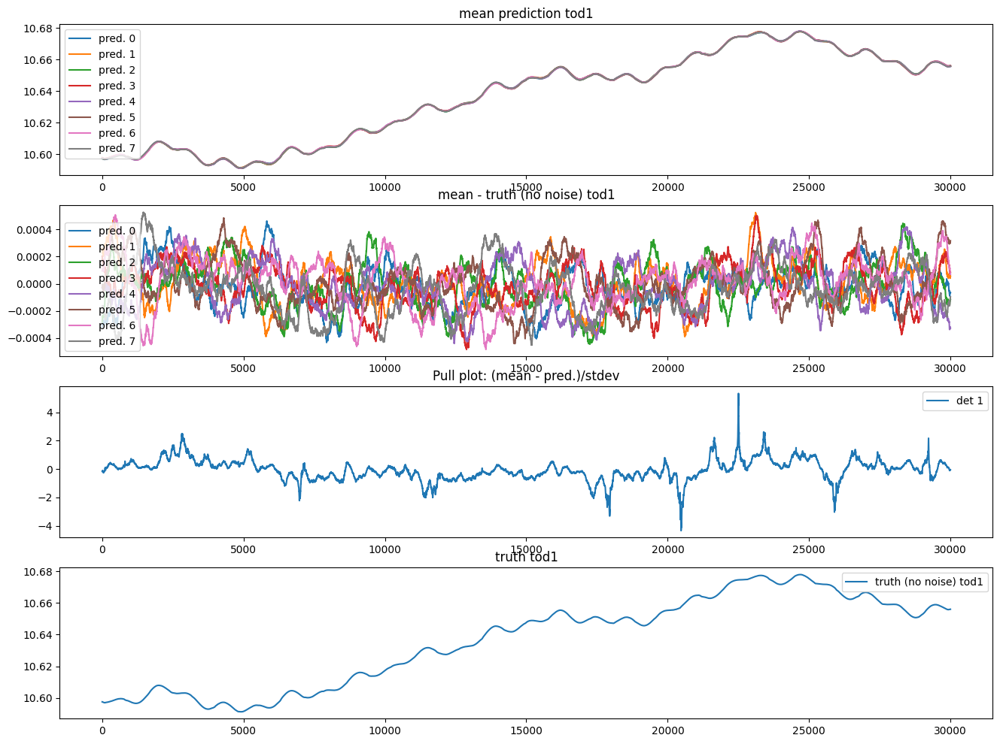

In [ ]:
mean, std = jft.mean_and_std(tuple(signal_response_tod(s) for s in samples))

fig, axes = plt.subplots(4, 1, figsize=(16, 12))
i = 1 # TOD id
j = 0
# for i in range(mean.shape[0]):
for s in samples:
    pred = signal_response_tod(s)
    
    im0 = axes[0].plot(np.arange(0, pred.shape[1]), pred[i], label=f"pred. {j}")
    im1 = axes[1].plot(np.arange(0, pred.shape[1]), pred[i] - denoised_jax_tod[i], label=f"pred. {j}")
    # im1 = axes[1].plot(np.arange(0, pred.shape[1]), pred[i] - denoised_jax_tod[i, 100:-100], label=f"pred. {j}")
    j += 1

im2 = axes[2].plot(np.arange(0, pred.shape[1]), (mean[i] - denoised_jax_tod[i])/std[i], label=f"det {i}")
# im2 = axes[2].plot(np.arange(0, pred.shape[1]), (mean[i] - denoised_jax_tod[i, 100:-100])/std[i], label=f"det {i}")
im3 = axes[3].plot(denoised_jax_tod[i], label=f"truth (no noise) tod{i}")
axes[0].title.set_text(f"mean prediction tod{i}")
axes[0].legend()
axes[1].title.set_text(f"mean - truth (no noise) tod{i}")
axes[1].legend()
axes[2].title.set_text(f"Pull plot: (mean - pred.)/stdev")
axes[2].legend()
axes[3].title.set_text(f"truth tod{i}")
axes[3].legend()

plt.show()

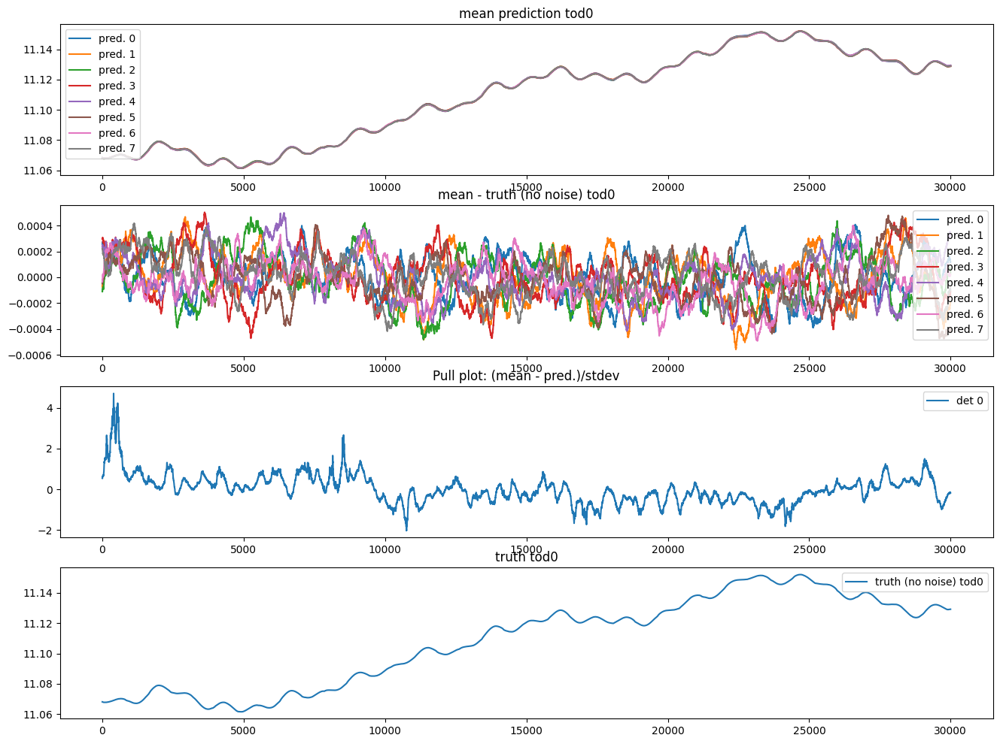

In [ ]:
mean, std = jft.mean_and_std(tuple(signal_response_tod(s) for s in samples))

fig, axes = plt.subplots(4, 1, figsize=(16, 12))
i = 0 # TOD id
j = 0
# for i in range(mean.shape[0]):
for s in samples:
    pred = signal_response_tod(s)
    
    im0 = axes[0].plot(np.arange(0, pred.shape[1]), pred[i], label=f"pred. {j}")
    im1 = axes[1].plot(np.arange(0, pred.shape[1]), pred[i] - denoised_jax_tod[i], label=f"pred. {j}")
    # im1 = axes[1].plot(np.arange(0, pred.shape[1]), pred[i] - denoised_jax_tod[i, 100:-100], label=f"pred. {j}")
    j += 1

im2 = axes[2].plot(np.arange(0, pred.shape[1]), (mean[i] - denoised_jax_tod[i])/std[i], label=f"det {i}")
# im2 = axes[2].plot(np.arange(0, pred.shape[1]), (mean[i] - denoised_jax_tod[i, 100:-100])/std[i], label=f"det {i}")
im3 = axes[3].plot(denoised_jax_tod[i], label=f"truth (no noise) tod{i}")
axes[0].title.set_text(f"mean prediction tod{i}")
axes[0].legend()
axes[1].title.set_text(f"mean - truth (no noise) tod{i}")
axes[1].legend()
axes[2].title.set_text(f"Pull plot: (mean - pred.)/stdev")
axes[2].legend()
axes[3].title.set_text(f"truth tod{i}")
axes[3].legend()

plt.show()

## Compare with maria mapper:

In [ ]:
from maria.mappers import BinMapper

mapper = BinMapper(center=(150, 10),
                   frame="ra_dec",
                   width=0.1,
                   height=0.1,
                   resolution=2e-4,
                   tod_preprocessing={
                        "window": {"name": "hamming"},
                        "remove_modes": {"modes_to_remove": [0]},
                        "despline": {"knot_spacing": 10},
                    },
                    map_postprocessing={
                        "gaussian_filter": {"sigma": 1},
                        "median_filter": {"size": 1},
                    },
                  )

mapper.add_tods(tod_truthmap)
output_map = mapper.run()

Running mapper (m2/f093): 100%|██████████| 1/1 [00:08<00:00,  8.86s/it]


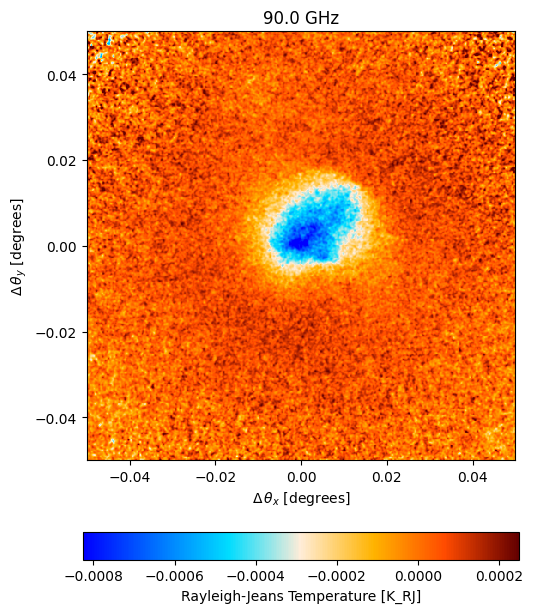

In [ ]:
output_map.plot()

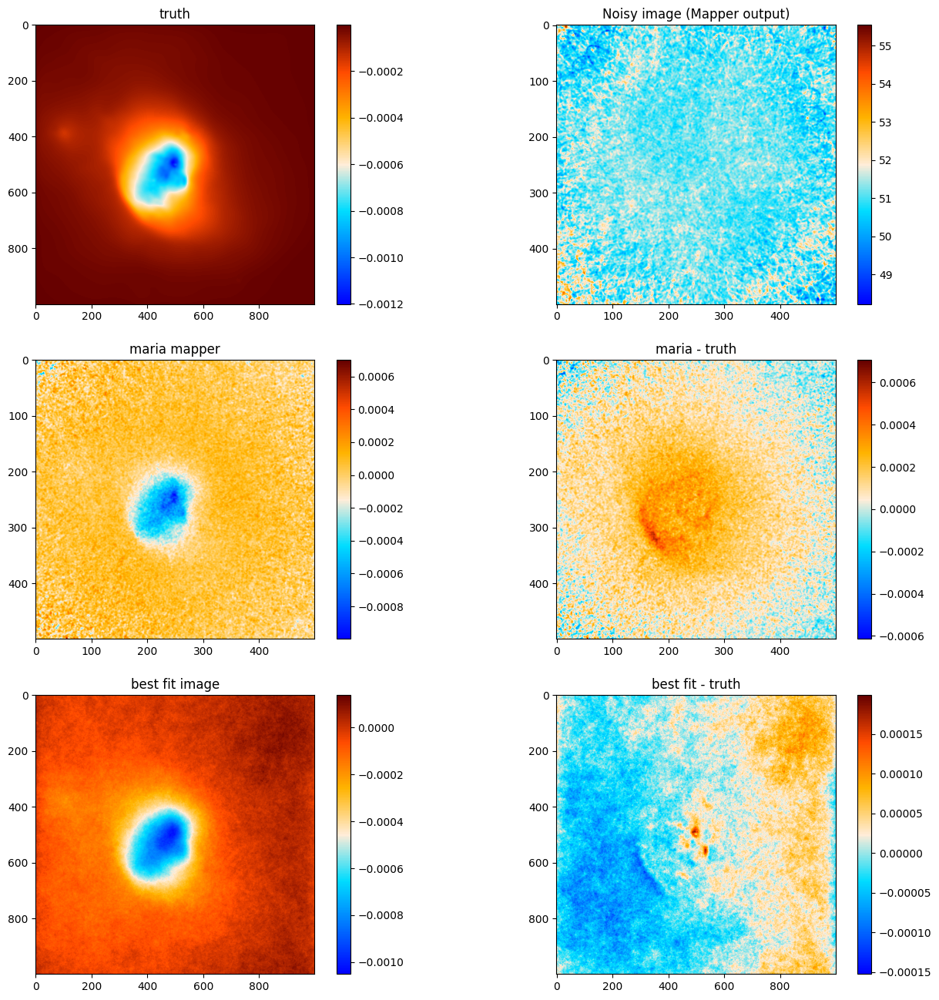

In [ ]:
from skimage.transform import resize

# Compare nifty vs maria
# sig_map = gp_map(samples.pos)[padding_map//2:-padding_map//2, padding_map//2:-padding_map//2] # when splitting up in different field models
sig_map = gp_map(samples.pos)
# mincol = -0.0012
# maxcol = 0.
mincol = None
maxcol = None

cmb_cmap = plt.get_cmap('cmb')
fig, axes = plt.subplots(3, 2, figsize=(16, 16))

im0 = axes[0,0].imshow( mapdata_truth[0,0] , cmap=cmb_cmap, vmin=mincol, vmax=maxcol)
axes[0,0].title.set_text('truth')
fig.colorbar(im0)

im1 = axes[0,1].imshow(output_truthmap.data[0,0], cmap=cmb_cmap, vmin=mincol, vmax=maxcol)
fig.colorbar(im1)
axes[0,1].title.set_text("Noisy image (Mapper output)")

im2 = axes[1,0].imshow(output_map.data[0, 0], cmap=cmb_cmap, vmin=mincol, vmax=maxcol)
axes[1,0].title.set_text('maria mapper')
fig.colorbar(im2)

truth_rescaled = resize(mapdata_truth[0,0], (500, 500), anti_aliasing=True)
im3 = axes[1,1].imshow((output_map.data[0, 0] - truth_rescaled), cmap=cmb_cmap, vmin=mincol, vmax=maxcol)
axes[1,1].title.set_text('maria - truth')
fig.colorbar(im3)

im3 = axes[2,0].imshow(sig_map, cmap=cmb_cmap, vmin=mincol, vmax=maxcol)
axes[2,0].title.set_text('best fit image')
fig.colorbar(im3)

im4 = axes[2,1].imshow((sig_map - mapdata_truth[0,0]), cmap=cmb_cmap, vmin=mincol, vmax=maxcol)
axes[2,1].title.set_text('best fit - truth')
fig.colorbar(im4)

plt.show()

## Compare with smoothed truth

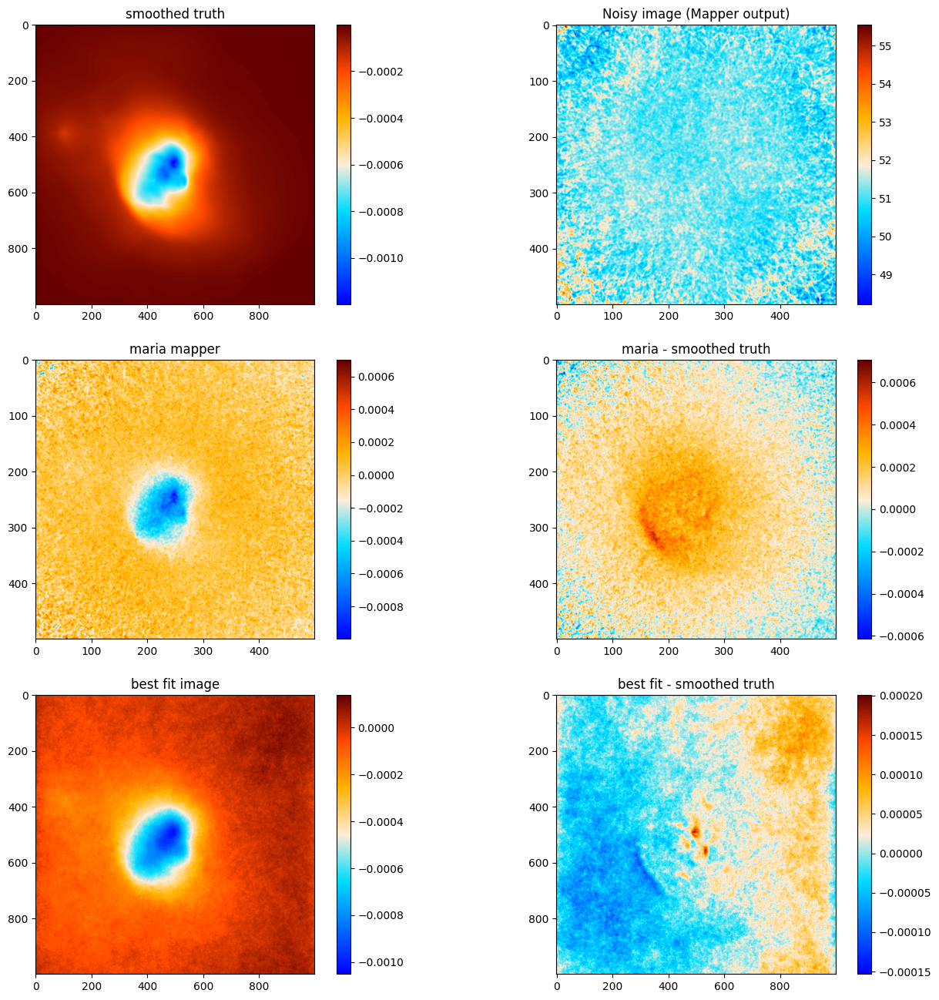

In [ ]:
from skimage.transform import resize
from scipy.ndimage import uniform_filter

# Compare nifty vs maria
# sig_map = gp_map(samples.pos)[padding_map//2:-padding_map//2, padding_map//2:-padding_map//2] # when splitting up in different field models
sig_map = gp_map(samples.pos)
# mincol = -0.0012
# maxcol = 0.
mincol = None
maxcol = None

smoothed_truth = uniform_filter(mapdata_truth[0,0], size=4)
# smoothed_truth = output_map_truth.data[0,0]

cmb_cmap = plt.get_cmap('cmb')
fig, axes = plt.subplots(3, 2, figsize=(16, 16))

im0 = axes[0,0].imshow( smoothed_truth , cmap=cmb_cmap, vmin=mincol, vmax=maxcol)
axes[0,0].title.set_text('smoothed truth')
fig.colorbar(im0)

im1 = axes[0,1].imshow(output_truthmap.data[0,0], cmap=cmb_cmap, vmin=mincol, vmax=maxcol)
fig.colorbar(im1)
axes[0,1].title.set_text("Noisy image (Mapper output)")

im2 = axes[1,0].imshow(output_map.data[0, 0], cmap=cmb_cmap, vmin=mincol, vmax=maxcol)
axes[1,0].title.set_text('maria mapper')
fig.colorbar(im2)

truth_rescaled = resize(smoothed_truth, (500, 500), anti_aliasing=True)
im3 = axes[1,1].imshow((output_map.data[0, 0] - truth_rescaled), cmap=cmb_cmap, vmin=mincol, vmax=maxcol)
axes[1,1].title.set_text('maria - smoothed truth')
fig.colorbar(im3)

im3 = axes[2,0].imshow(sig_map, cmap=cmb_cmap, vmin=mincol, vmax=maxcol)
axes[2,0].title.set_text('best fit image')
fig.colorbar(im3)

im4 = axes[2,1].imshow((sig_map - smoothed_truth), cmap=cmb_cmap, vmin=mincol, vmax=maxcol)
axes[2,1].title.set_text('best fit - smoothed truth')
fig.colorbar(im4)

plt.show()